In [23]:
import pylablib.aux_libs.devices.DCAM as cam
from pylablib.aux_libs.devices.DCAM_lib import lib, DCAMLibError

import matplotlib.pyplot as plt
import sys
sys.path.append('C:\\Users\\IFIc\\Projects\\sabatsw\\laserlab\\scripts')
from galvo_python.galvos import *
from galvo_python.gaussian2dFit import *
from time import sleep
import logging
import warnings
from skimage import io

In [24]:
logging.getLogger().setLevel(logging.CRITICAL)

## Initialize camera and galvos 

In [25]:
serialport = open_serial_port()

In [29]:
cam.get_cameras_number(), cam.DCAMCamera(0).get_model_data()

(1,
 ModelData(vendor='Hamamatsu', model='C13440-20C', serial_number='S/N: 303065', camera_version='4.31.B'))

In [13]:
min_texp

0.0010036691729323308

In [30]:
cam0 = cam.DCAMCamera(0)
lib.dcamapi_uninit()     # For some reason this must be run before opening the camera
cam0.open()

min_texp = cam0.properties['EXPOSURE TIME'].min
cam0.set_value('EXPOSURE TIME', min_texp)

cam0.start_acquisition()
cam0.get_status()

'busy'

In [56]:
cam0.stop_acquisition()

In [16]:
cam0.start_acquisition(mode='snap', nframes=100)
cam0.get_status()

'busy'

#  Take snap

In [27]:
center0 = [int(65534./2) + 3150, int(65534./2) +  4650] #calibrated on 26/05/2020, normal incidence on galvo

move_to_positionXY(serialport, [0,0], center=center0)

In [34]:
move_to_positionXY(serialport, [2000, 0], center=center0)

In [11]:
cam0.set_roi(hstart=850, hend=1150, vstart=900, vend=1200)

(848, 1148, 900, 1200, 1)

[1276.7477667977805,
 967.9592414768609,
 1069.9795551015534,
 71.9214299567696,
 0.10381205207746615]

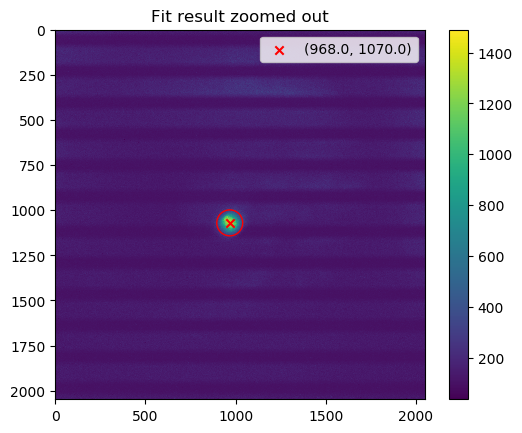

In [20]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

[2072.5036667525183,
 1011.9015691400933,
 1044.873247534105,
 85.6820913741555,
 0.05570499189502314]

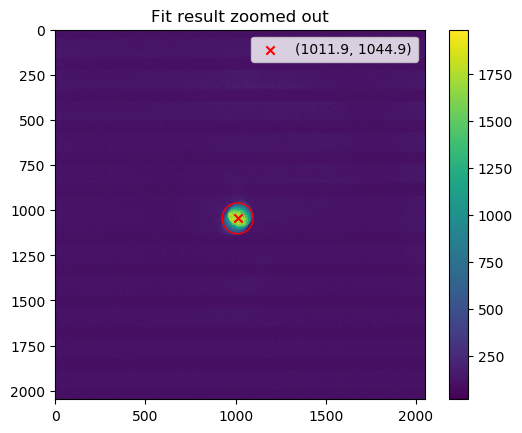

In [30]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

[2073.2955949923553,
 1012.4131419411322,
 1041.9784935065732,
 85.28966683642497,
 0.055408917070057566]

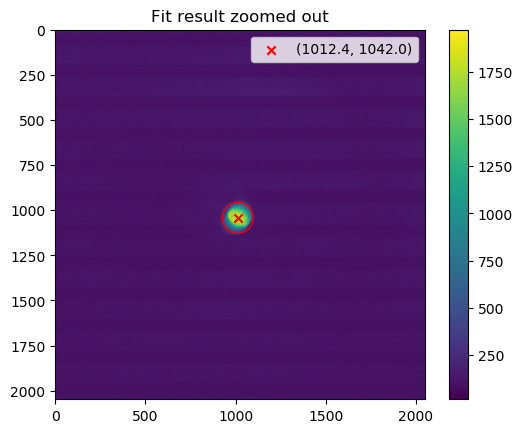

In [32]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

[2343.4928453778216,
 913.4604392237476,
 1072.4027885041162,
 80.33933329435773,
 0.04968949309023235]

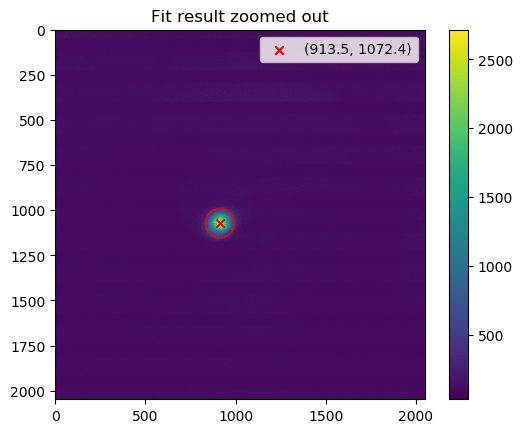

In [37]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

[27.994462241325234,
 135.38669683028888,
 124.37703157415754,
 99.42856670952035,
 4.110378820370655]

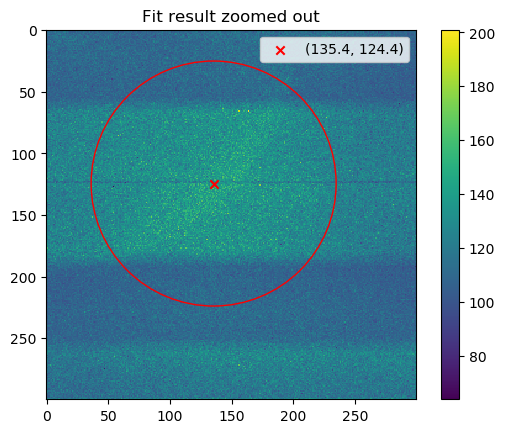

In [22]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

[1023.1435898164065,
 161.13965676517097,
 150.5654298968056,
 81.24802764292826,
 0.09323261816304201]

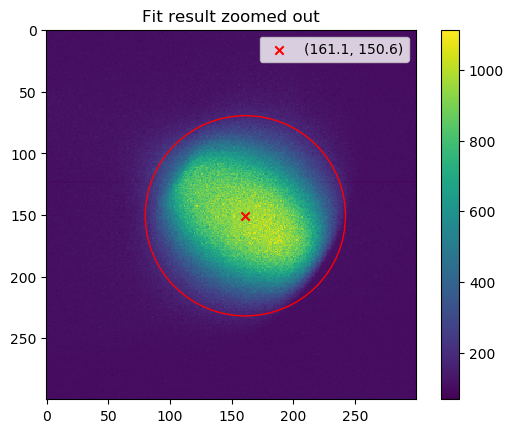

In [45]:
%matplotlib inline
plt.style.use('default')
frame1 = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

In [48]:
frame1-frame

array([[    1,     2,     1, ...,     1,     8,    20],
       [65529,     5,     5, ..., 65535, 65532, 65532],
       [65535, 65532,     5, ...,     6,     2,     7],
       ...,
       [    3,     1, 65533, ...,     8,     0,     3],
       [65533, 65535,     2, ..., 65532, 65533, 65534],
       [65528, 65527, 65535, ..., 65533, 65531, 65527]], dtype=uint16)

In [52]:
np.subtract(frame1, frame)

array([[    1,     2,     1, ...,     1,     8,    20],
       [65529,     5,     5, ..., 65535, 65532, 65532],
       [65535, 65532,     5, ...,     6,     2,     7],
       ...,
       [    3,     1, 65533, ...,     8,     0,     3],
       [65533, 65535,     2, ..., 65532, 65533, 65534],
       [65528, 65527, 65535, ..., 65533, 65531, 65527]], dtype=uint16)

In [55]:
frame.shape

(300, 300)

In [54]:
frame1.shape

(300, 300)

In [57]:
frame.astype(np.float16) - frame1.astype(np.float16)

array([[ -1.,  -2.,  -1., ...,  -1.,  -8., -20.],
       [  7.,  -5.,  -5., ...,   1.,   4.,   4.],
       [  1.,   4.,  -5., ...,  -6.,  -2.,  -7.],
       ...,
       [ -3.,  -1.,   3., ...,  -8.,   0.,  -3.],
       [  3.,   1.,  -2., ...,   4.,   3.,   2.],
       [  8.,   9.,   1., ...,   3.,   5.,   9.]], dtype=float16)

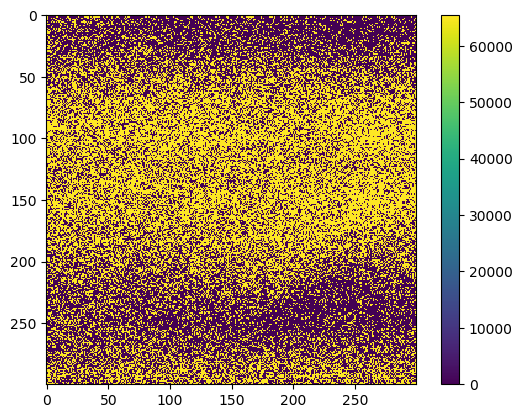

In [47]:
gray = plt.imshow(frame1-frame)
plt.colorbar(gray)

In [32]:
rangex = range(-10, 10)
rangey = range(-10, 10)

In [62]:
frame = frame.astype(np.int16)
total_frame = np.zeros_like(frame)
total_frame

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int16)

In [60]:
frame0.astype(np.int16)

array([[107, 109, 111, ..., 101, 109,  99],
       [107, 100, 106, ..., 103, 103,  99],
       [101,  98, 103, ..., 101,  94, 101],
       ...,
       [101, 102, 107, ..., 104, 109, 106],
       [107, 104, 105, ..., 101, 104, 105],
       [105, 101, 107, ..., 109, 107, 102]], dtype=int16)

C:\Users\IFIc\Anaconda3\lib\site-packages\matplotlib\transforms.py:2832: RuntimeWarning: overflow encountered in short_scalars
  elif vmax - vmin <= maxabsvalue * tiny:


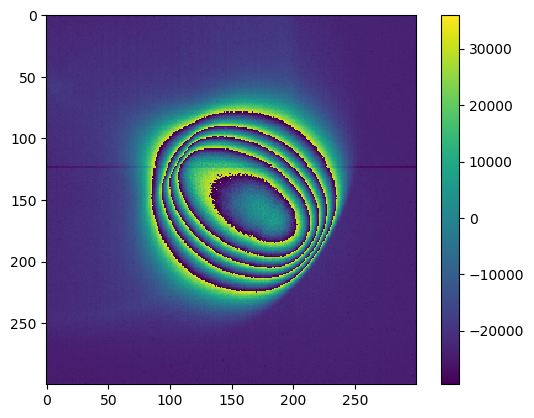

In [63]:
%matplotlib inline
plt.style.use('default')

for x in rangex:
    for y in rangey:
        move_to_positionXY(serialport, position=(x,y), center=center0, wait=0.1)
        frame0 = cam0.get_frame(100)
        total_frame += frame0.astype(np.int16)
gray = plt.imshow(total_frame)
plt.colorbar(gray)

In [96]:
type(scaled_frame[0,0])
type(scale)

numpy.int32

In [95]:
scale = total_frame.min().astype(int)
scaled_frame = total_frame.astype(int) - scale
scaled_frame.sum()


-567754767

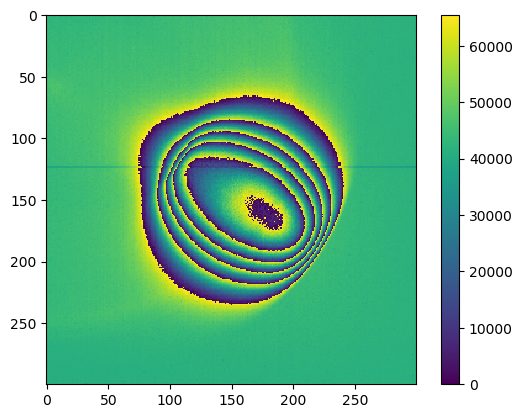

In [97]:
gray = plt.imshow(scaled_frame)
plt.colorbar(gray)

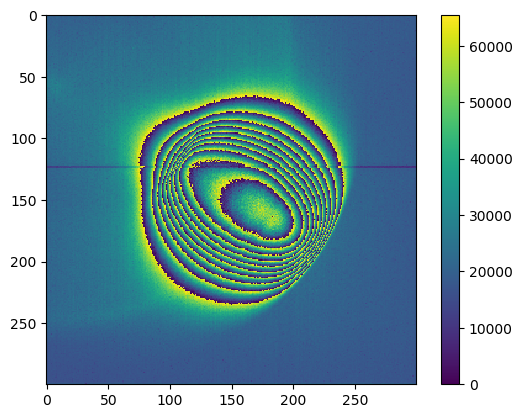

In [38]:
%matplotlib inline
plt.style.use('default')
for x in rangex:
    for y in rangey:
        move_to_positionXY(serialport, position=(x,y), center=center0, wait=0.05)
        frame0 = cam0.get_frame(100)
        total_frame += frame0.astype(int)
gray = plt.imshow(total_frame)
plt.colorbar(gray)

In [32]:
rangex = range(-5, 5)
rangey = range(-5, 5)

C:\Users\IFIc\Anaconda3\lib\site-packages\matplotlib\transforms.py:2832: RuntimeWarning: overflow encountered in short_scalars
  elif vmax - vmin <= maxabsvalue * tiny:


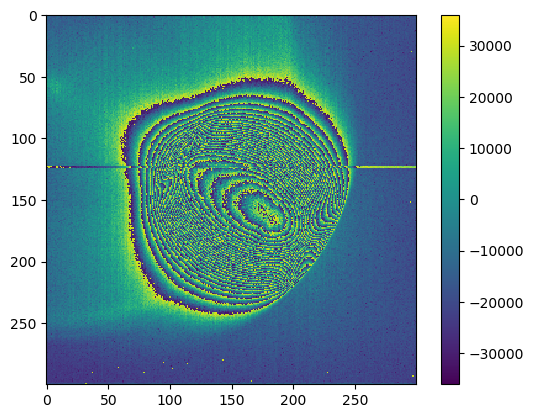

In [101]:
%matplotlib inline
plt.style.use('default')

move_to_positionXY(serialport, position=(0,0), center=center0, wait=0.7)
frameRef = cam0.get_frame(100)

for x in rangex:
    for y in rangey:
        move_to_positionXY(serialport, position=(x,y), center=center0, wait=0.7)
        frame0 = cam0.get_frame(100)
        total_frame += frame0.astype(np.int16)
gray = plt.imshow(total_frame)
plt.colorbar(gray)

<IPython.core.display.Javascript object>


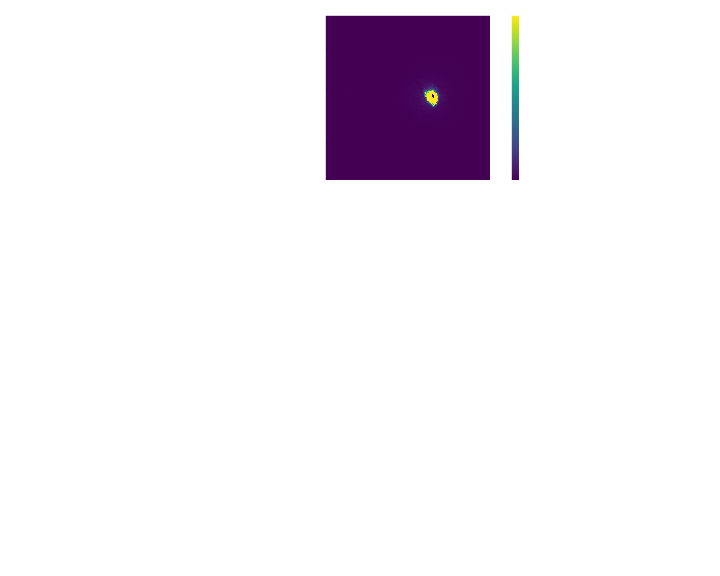

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


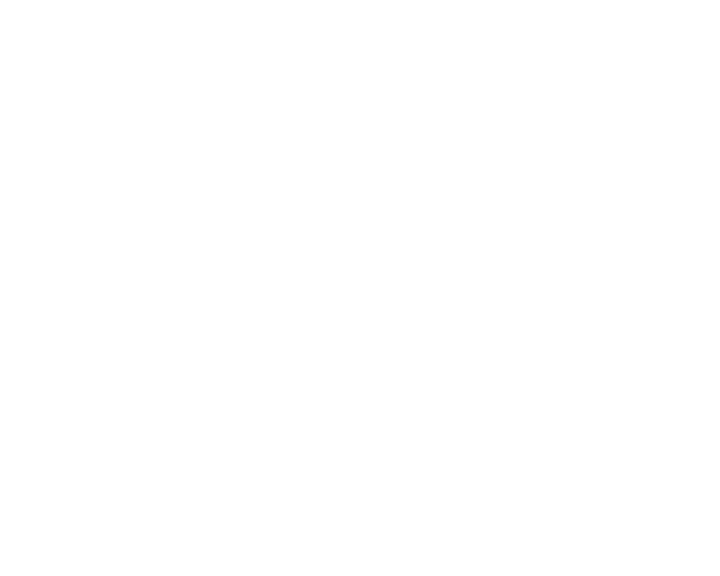

In [78]:
#LOOP WITH FOR INSTEAD OF WHILE


%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []

frame0 = cam0.get_frame(100)
mx = guess_centroid(frame0)
bounds = bound_roi(frame0, mx, size = 400)
imroi = select_roi(frame0, bounds)
mxroi = guess_centroid(imroi)
fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
sigma_x = fitc[2]
sigma_y = fitr[2]
p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]

for i in range(0,int(1e2)):
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(3, 1, 1)
    
    frame0 = cam0.get_frame(100)
    
    gray = ax1.imshow(frame0)
    fig.colorbar(gray)
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...  

# Power series 2 photon 

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im500uw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


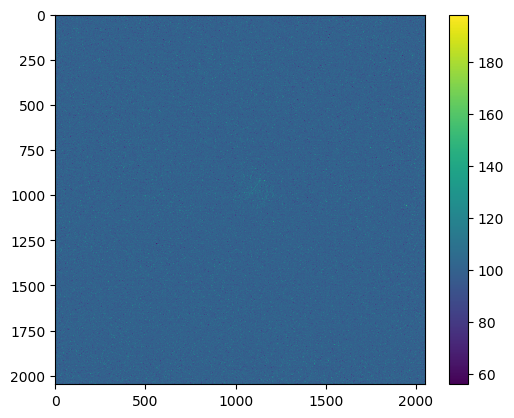

In [37]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im500uw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im1mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


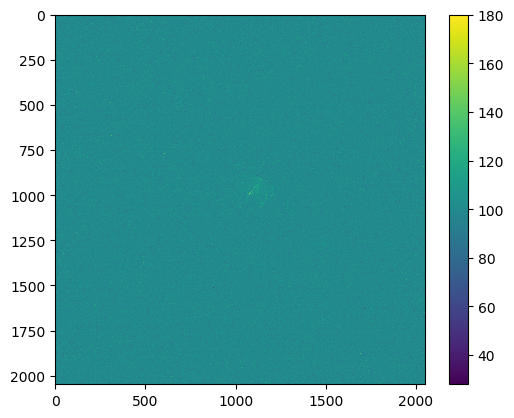

In [36]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im1mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im5mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


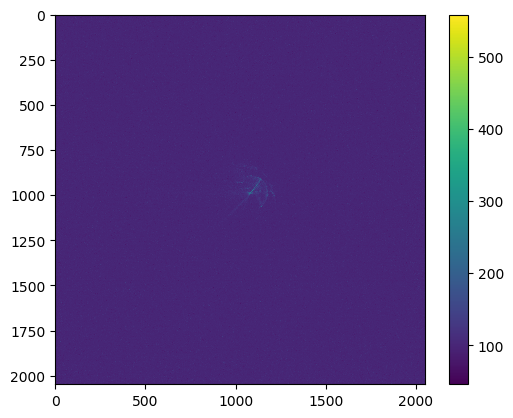

In [41]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im5mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im10mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


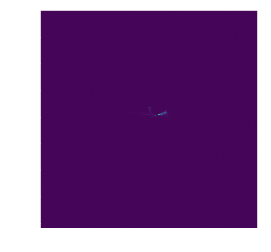

In [19]:
%matplotlib inline
frame = cam0.get_frame(100)

io.imsave('im10mw.tiff', frame)
plt.imshow(frame)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im20mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


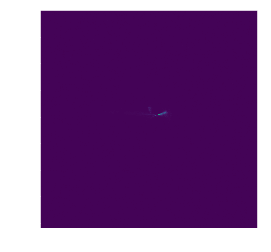

In [20]:
%matplotlib inline
frame = cam0.get_frame(100)

io.imsave('im20mw.tiff', frame)
plt.imshow(frame)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im50mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


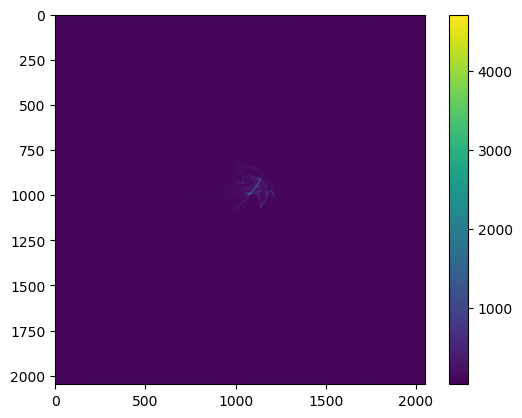

In [56]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im50mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im100mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


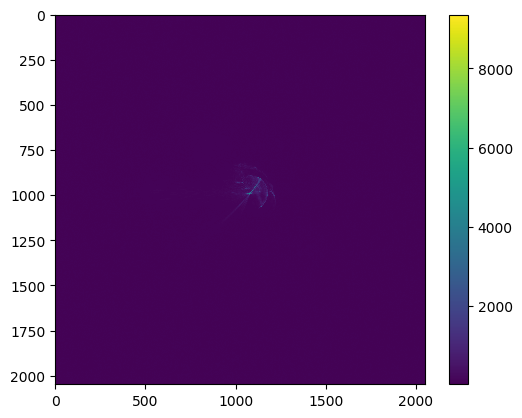

In [55]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im100mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im150mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


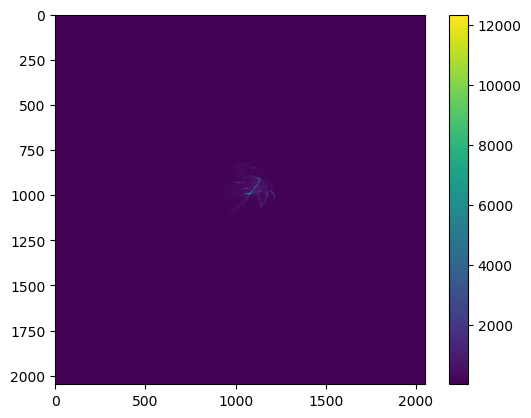

In [57]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im150mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im215mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


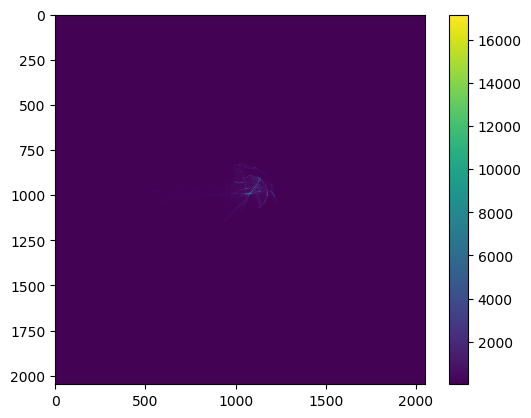

In [58]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im215mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: im240mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


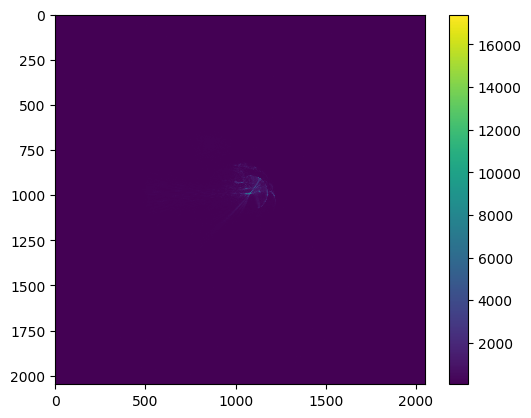

In [63]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('im240mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

In [88]:
Pin = [0.5, 1, 5, 10, 20, 50, 100, 150, 215, 240]
Pfluo = [plt.imread('./im500uw.tiff').sum()]
for p in Pin[1:]:
    pf = plt.imread('./im'+str(p)+'mw.tiff').sum()
    Pfluo.append(pf)

Text(0, 0.5, 'Total image count [A. U.]')

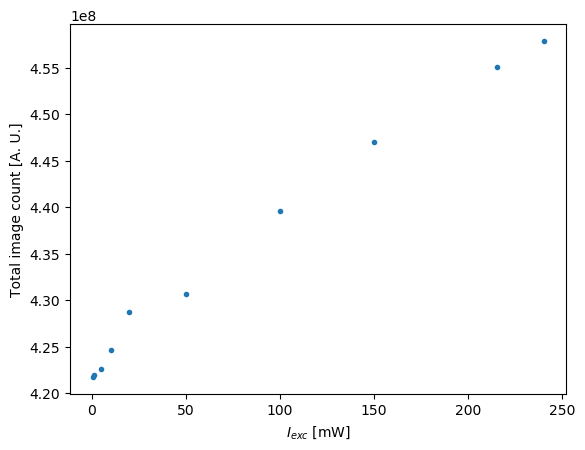

In [90]:
plt.plot(Pin, Pfluo, '.')
plt.xlabel('$I_{exc}$ [mW]')
plt.ylabel('Total image count [A. U.]')

In [66]:
Pin = [0.5, 1, 5, 10, 20, 50, 100, 150, 215, 240]
Pfluo = [plt.imread('./im500uw.tiff').max()]
for p in Pin[1:]:
    pf = plt.imread('./im'+str(p)+'mw.tiff').max()
    Pfluo.append(pf)

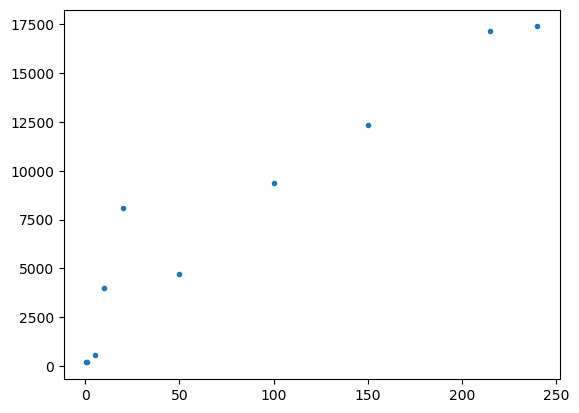

In [67]:
plt.plot(Pin, Pfluo, '.')

## Repeat for I < 70 mW 

In case the spot burnt the sample, start with a different point

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries70mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


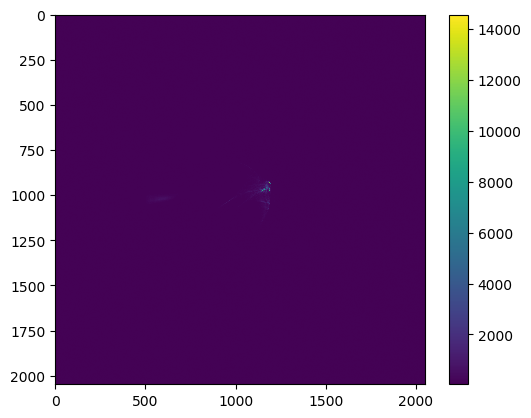

In [68]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries70mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries50mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


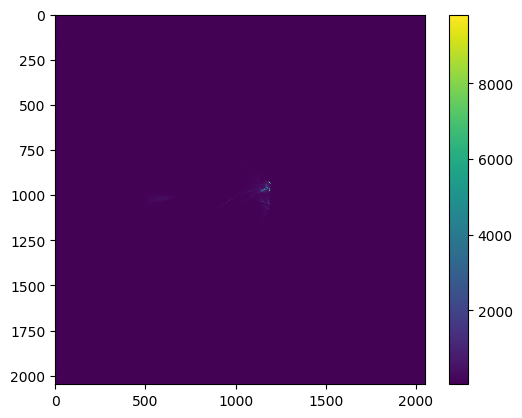

In [69]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries50mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries30mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


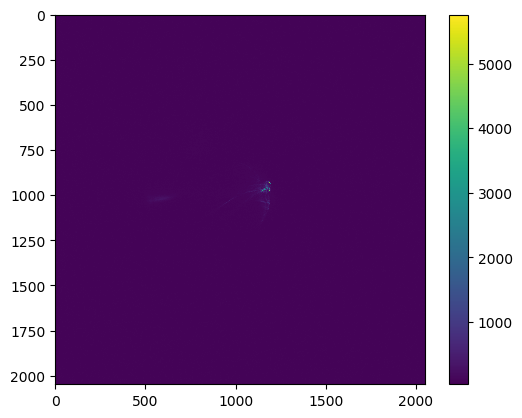

In [70]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries30mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries20mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


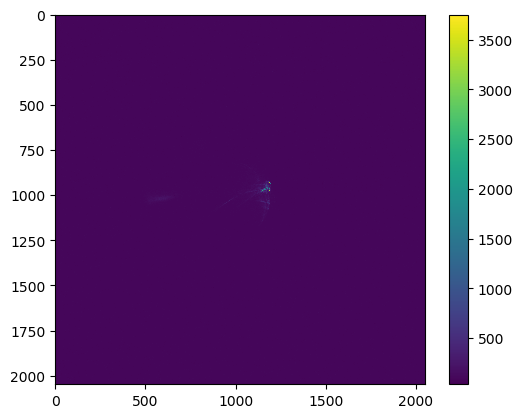

In [71]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries20mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries10mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


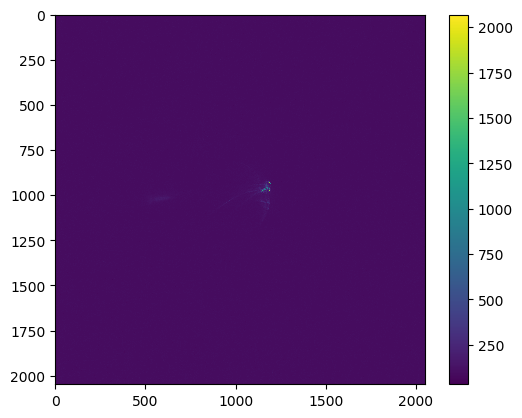

In [72]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries10mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries5mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


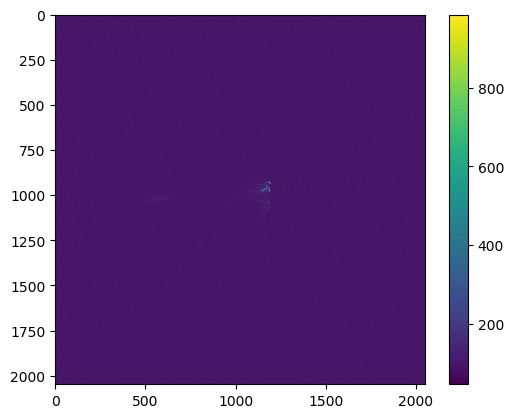

In [74]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries5mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries1mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


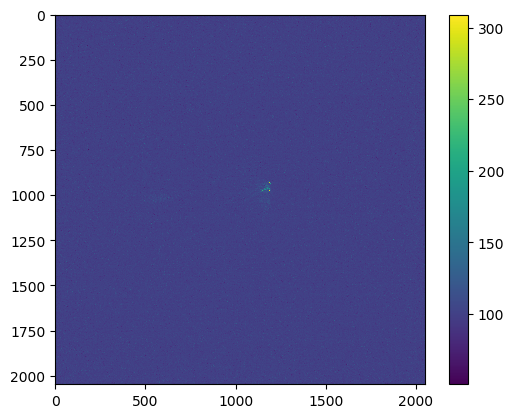

In [75]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries1mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries700uw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


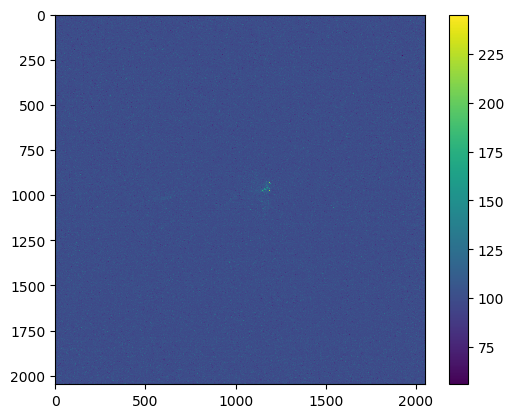

In [76]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries700uw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries500uw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


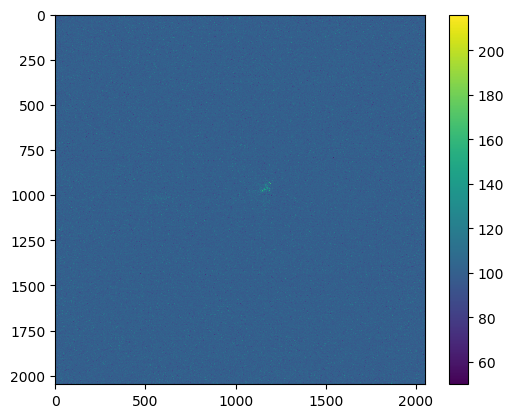

In [77]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries500uw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

In [91]:
Pin = [0.5, 0.7, 1, 5, 10, 20, 30, 50, 70]
Pfluo = [plt.imread('./pseries500uw.tiff').sum(), plt.imread('./pseries700uw.tiff').sum()]
for p in Pin[2:]:
    pf = plt.imread('./pseries'+str(p)+'mw.tiff').sum()
    Pfluo.append(pf)

Text(0, 0.5, 'Total image count [A. U.]')

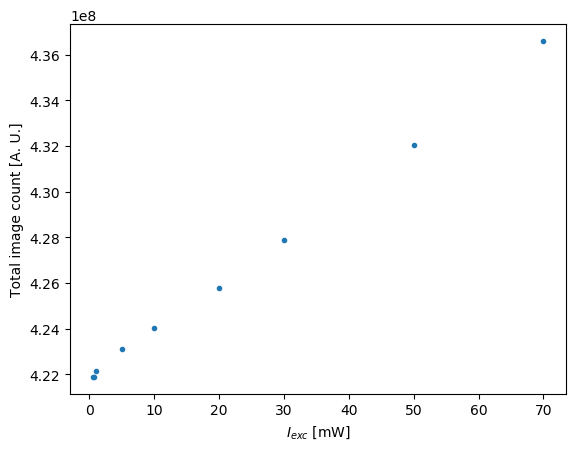

In [92]:
plt.plot(Pin, Pfluo, '.')
plt.xlabel('$I_{exc}$ [mW]')
plt.ylabel('Total image count [A. U.]')

In [85]:
Pin = [0.5, 0.7, 1, 5, 10, 20, 30, 50, 70]
Pfluo = [plt.imread('./pseries500uw.tiff').max(), plt.imread('./pseries700uw.tiff').max()]
for p in Pin[2:]:
    pf = plt.imread('./pseries'+str(p)+'mw.tiff').max()
    Pfluo.append(pf)

Text(0, 0.5, 'Max image count [A. U.]')

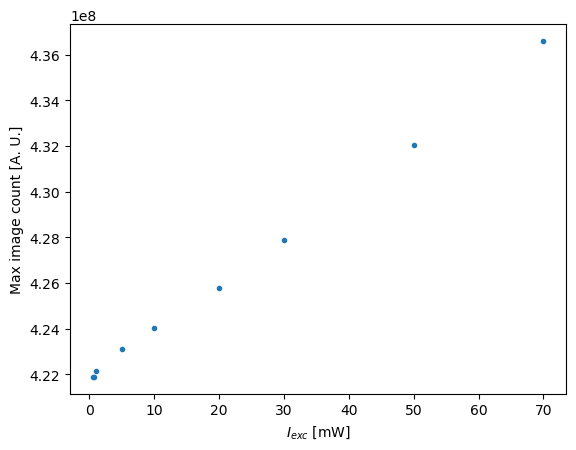

In [93]:
plt.plot(Pin, Pfluo, '.')
plt.xlabel('$I_{exc}$ [mW]')
plt.ylabel('Max image count [A. U.]')

## Repeat with FBand420 and FShort450 

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries200mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


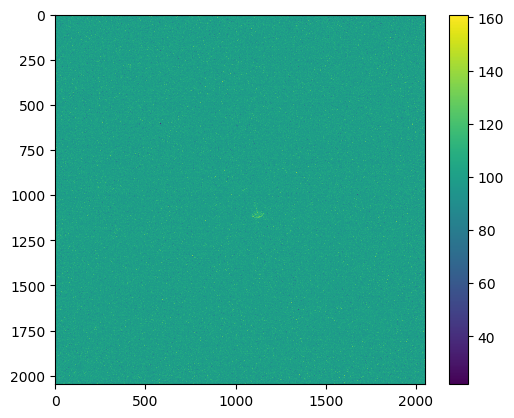

In [5]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries200mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries350mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


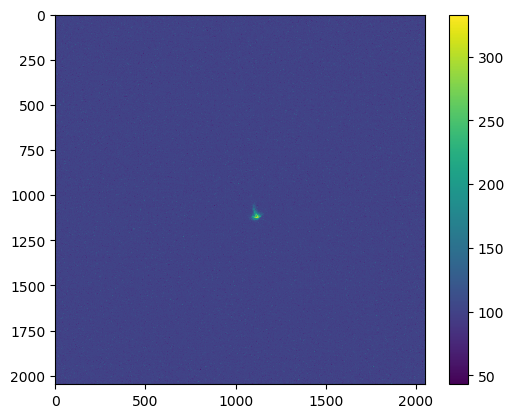

In [6]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries350mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries450mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


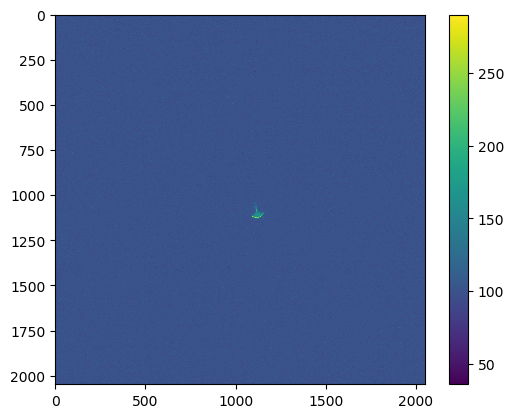

In [7]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries450mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries550mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


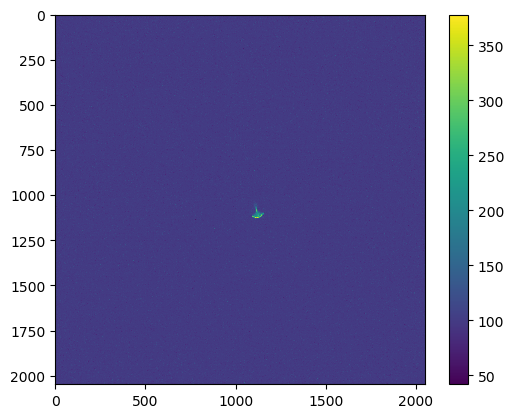

In [8]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries550mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries650mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


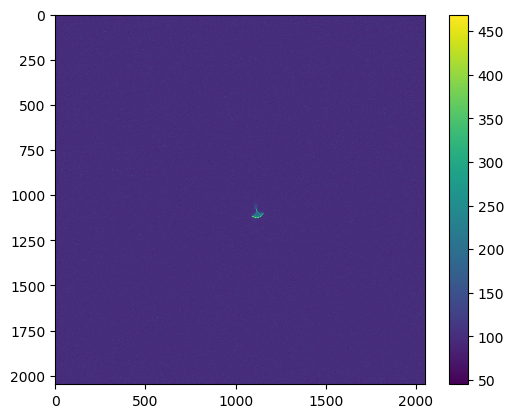

In [9]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries650mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

In [10]:
Pin = [200, 350, 450, 550, 650]
Pfluo = []
for p in Pin:
    pf = plt.imread('./pseries'+str(p)+'mw.tiff').max()
    Pfluo.append(pf)

Text(0, 0.5, 'Max image count [A. U.]')

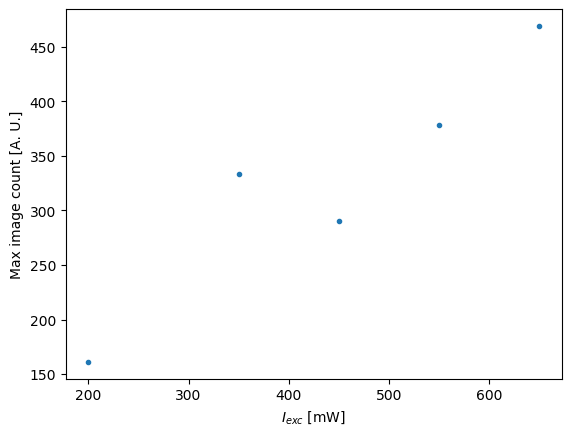

In [11]:
plt.plot(Pin, Pfluo, '.')
plt.xlabel('$I_{exc}$ [mW]')
plt.ylabel('Max image count [A. U.]')

## Low power series 

In [5]:
cam0.start_acquisition(mode='snap', nframes=10)

In [17]:
time.clock()

C:\Users\IFIc\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


859.6640411

In [18]:
%matplotlib inline
plt.style.use('default')
fig = plt.figure(figsize=(10,8))

#plt.style.use('default')
totCounts = []
times = []
for i in range(100):
    frame = cam0.snap(nframes=1)
    totCounts.append(frame.sum())
    times.append(time.clock())

C:\Users\IFIc\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if sys.path[0] == '':


<Figure size 1000x800 with 0 Axes>

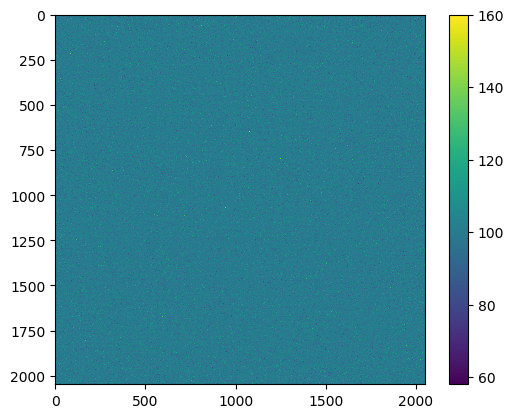

In [22]:
frame = cam0.snap(nframes=1)
gray =plt.imshow(frame[0])
plt.colorbar(gray)

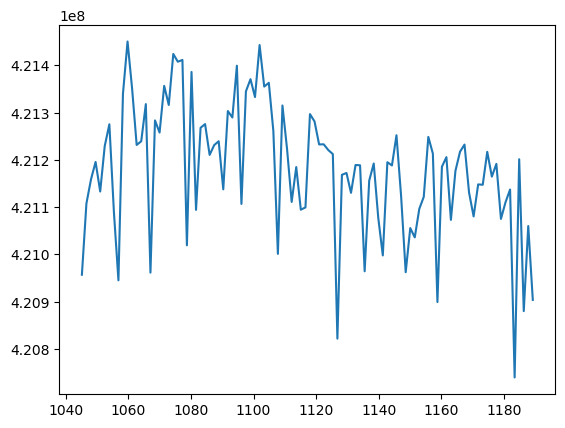

In [19]:
plt.plot(times, totCounts)

In [10]:
im = []
for i in range(5):
    im.append(plt.imread('pseries10mw'+str(i)+'.tiff').sum()ii)

In [12]:

plt.plot(im)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries10mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


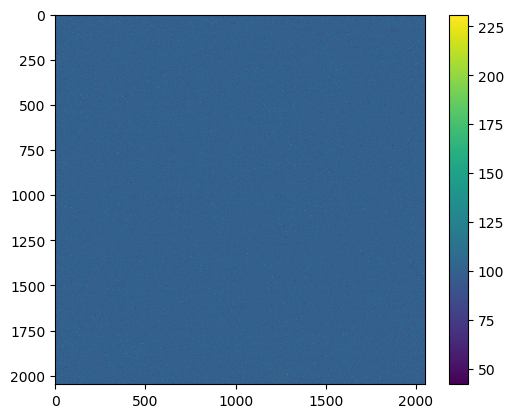

In [11]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries10mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: pseries20mw.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


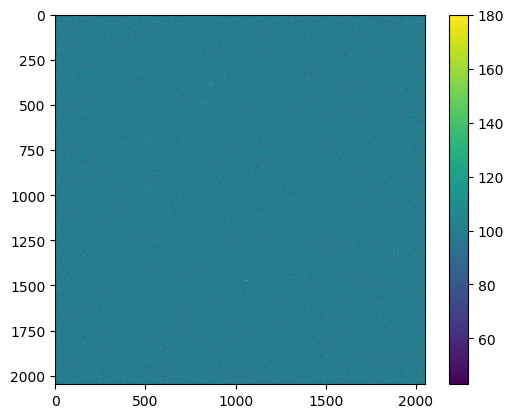

In [13]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

io.imsave('pseries20mw.tiff', frame)
gray = plt.imshow(frame)
plt.colorbar(gray)

# Video with while 

### FBI-Ba 

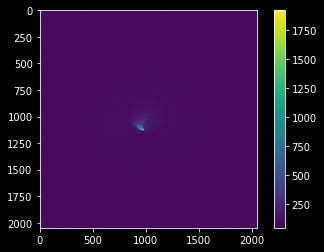

In [46]:
%matplotlib inline
plt.style.use('dark_background')
frame0 = cam0.get_frame(100)
bar = plt.imshow(frame0)
plt.colorbar(bar)

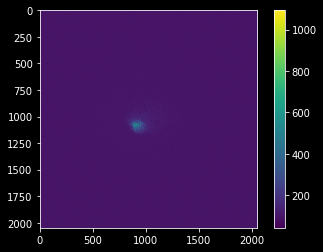

In [41]:
%matplotlib inline
plt.style.use('dark_background')
frame0 = cam0.get_frame(100)
bar = plt.imshow(frame0)
plt.colorbar(bar)

### Reflexion comparison 

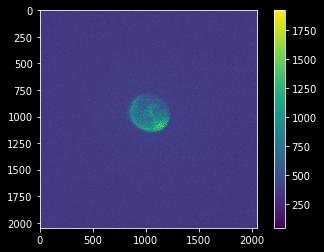

In [48]:
%matplotlib inline
plt.style.use('dark_background')
frameR = cam0.get_frame(100)
barR = plt.imshow(frameR)
plt.colorbar(bar)

### FBI-Ba 2 filters 

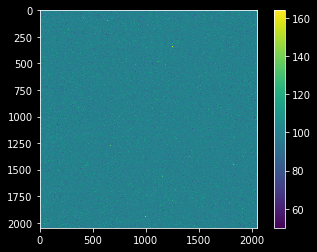

In [55]:
%matplotlib inline
plt.style.use('dark_background')
frame2 = cam0.get_frame(100)
bar2 = plt.imshow(frame2)
plt.colorbar(bar2)

### Reflexion comparison 2 filters 

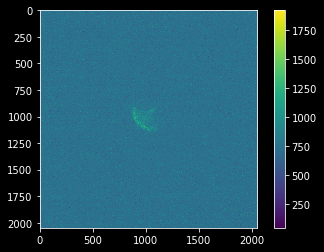

In [50]:
%matplotlib inline
plt.style.use('dark_background')
frame2R = cam0.get_frame(100)
bar2R = plt.imshow(frame2 R)
plt.colorbar(bar)

<IPython.core.display.Javascript object>


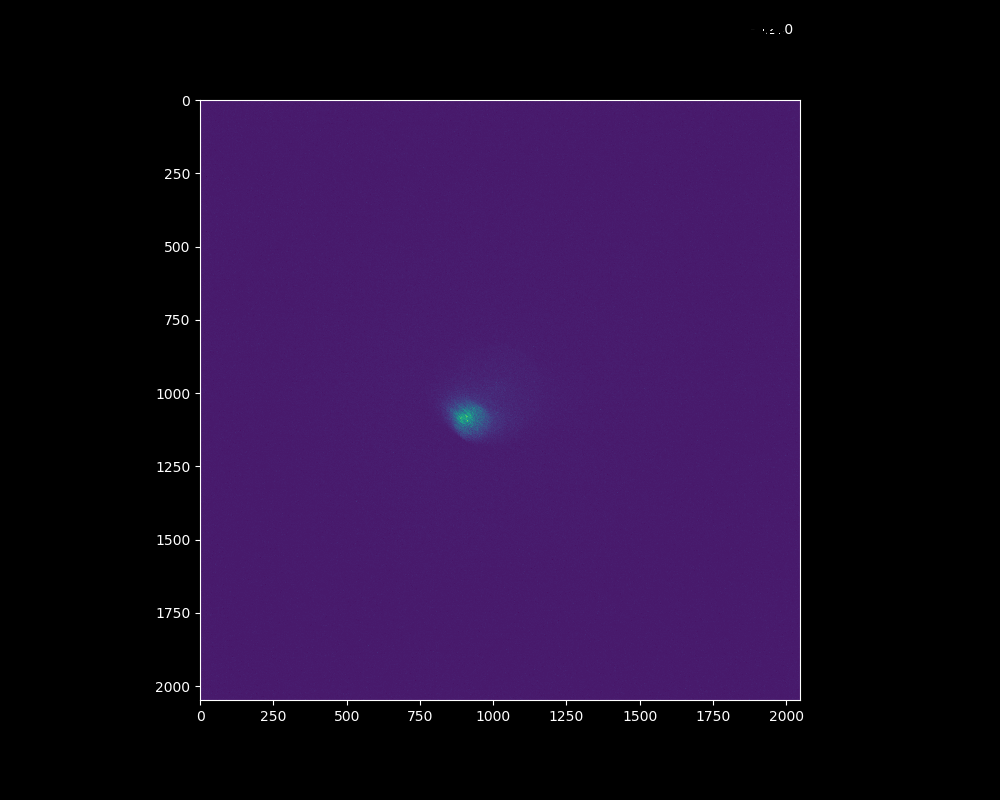

KeyboardInterrupt: 

In [35]:
%matplotlib notebook
#fig, ax = plt.subplots(1, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')

while True:
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(1, 1, 1)
    
    frame0 = cam0.get_frame(100)
    
    gray = ax1.imshow(frame0)
    fig.colorbar(gray)
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...    

<IPython.core.display.Javascript object>


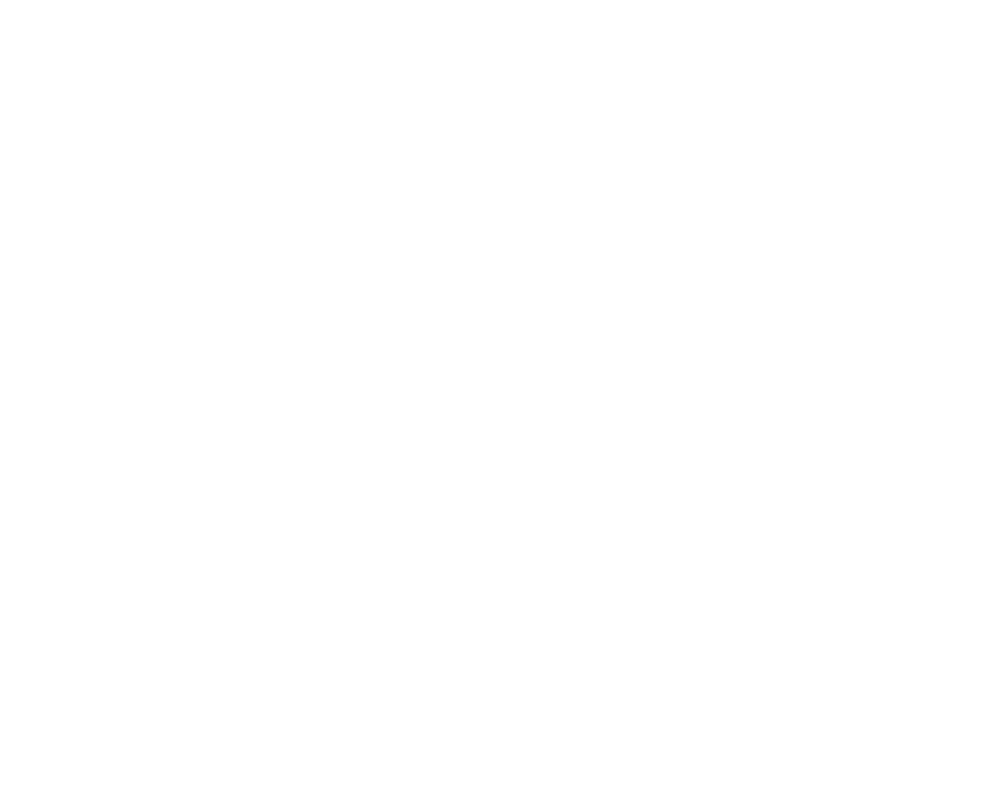

DCAMLibError: function 'dcambuf_lockframe' raised error -2147483391 (DCAMERR_BUSY): API cannot process in busy state.

In [28]:
%matplotlib notebook
#fig, ax = plt.subplots(1, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []

frame0 = cam0.get_frame(100)
mx = guess_centroid(frame0)
bounds = bound_roi(frame0, mx, size = 400)
imroi = select_roi(frame0, bounds)
mxroi = guess_centroid(imroi)
fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
sigma_x = fitc[2]
sigma_y = fitr[2]
p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]

while True:
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(3, 1, 1)
    
    frame0 = cam0.get_frame(100)
    
    gray = ax1.imshow(frame0)
    fig.colorbar(gray)
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...    

## Check reference image size right after galvo 

In [22]:
frameRef = plt.imread("./aligning_4f_052020/nolens_noiris_3cm.tiff")
gray = plt.imshow(frameRef)
plt.colorbar(gray)

bestfit1 = guessNfitGaussian2d(frameRef, flag_p=True)

In [23]:
xref, yref = bestfit1[1:3]
rRef = bestfit1[3]
rRef

280.7183325525021

## Realigning without lenses, with 2 pinholes 

The procedure is the following:

- Use the first aligning mirror to direct the spot to the center of both galvo mirrors
- Use the second aligning mirror to focus it through the first pinhole
- To make the spot pass through the second pinhole, play with the second aligning mirror, the rotation of the galvos (not the position, just for large adjustment) and the origin of the galvos rotation (center0) for fine tuning. 

# Find lens 2 focus and center 

## Center

<IPython.core.display.Javascript object>


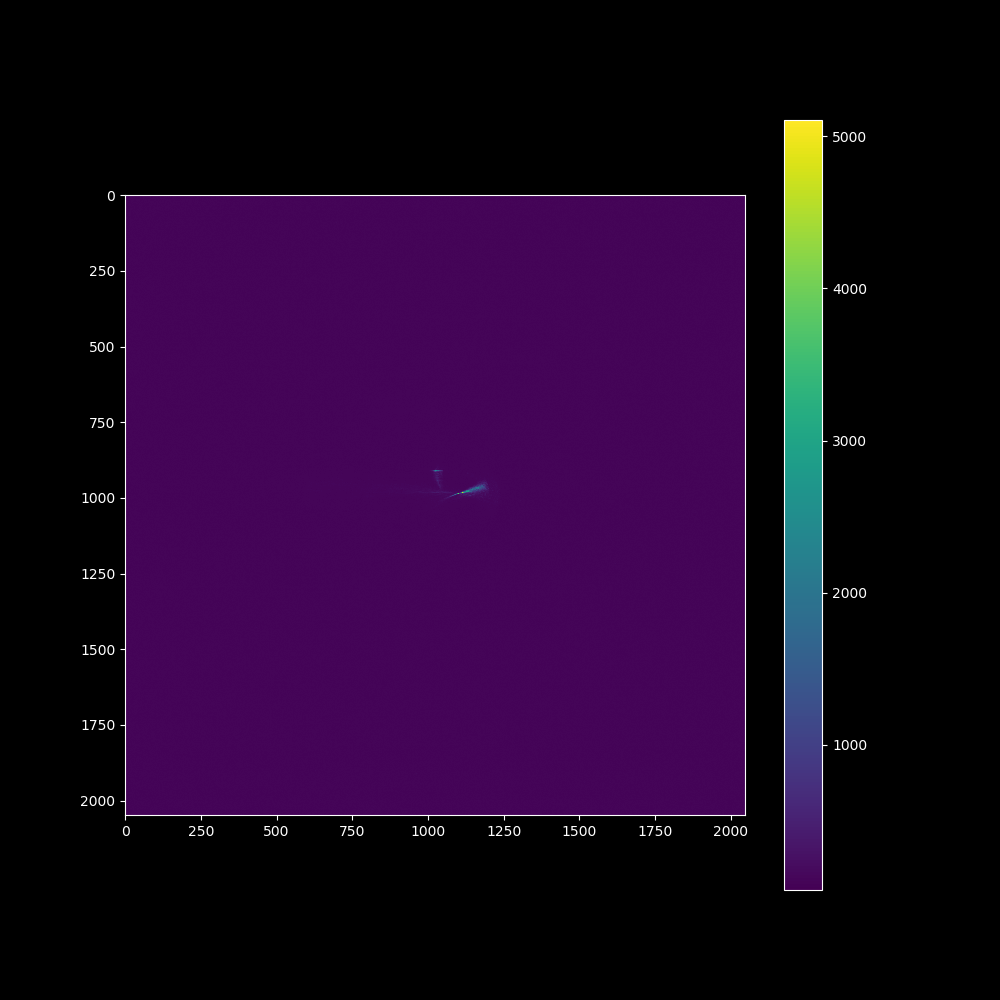

NameError: name 'xref' is not defined

In [15]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,10))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []
while True:
    fig = plt.gcf()
    ax1 = fig.add_subplot(1, 1, 1)
    
    frame0 = cam0.get_frame(100)

    img = ax1.imshow(frame0)
    fig.colorbar(img)
    mx = guess_centroid(frame0)

    ax1.scatter(x=xref, y=yref, marker='x',
     color='g', label = 'Ref: (%.1f, %.1f)' %(xref, yref))
    
    ax1.scatter(x=mx[1], y=mx[0], marker='x',
     color='r', label = '(%.1f, %.1f)' %(mx[0], mx[1]))
    ax1.legend()

    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    plt.clf()

## Focus z

<IPython.core.display.Javascript object>


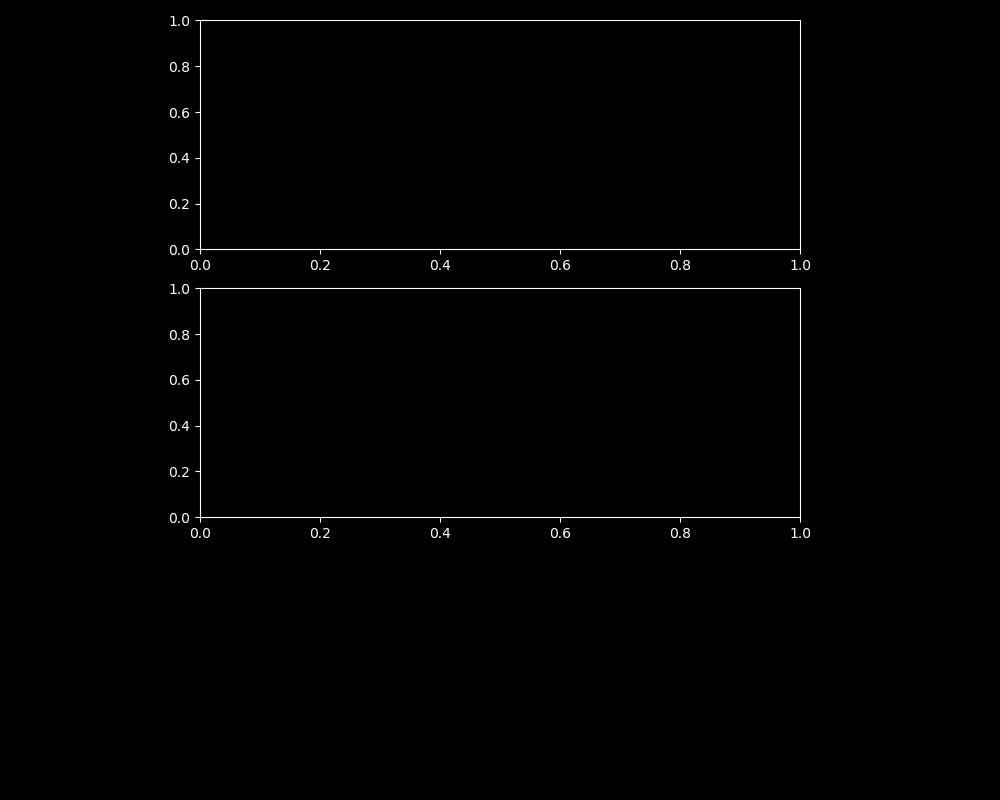

KeyboardInterrupt: 

In [14]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []

frame0 = cam0.get_frame(100)
mx = guess_centroid(frame0)
bounds = bound_roi(frame0, mx, size = 400)
imroi = select_roi(frame0, bounds)
mxroi = guess_centroid(imroi)
fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
sigma_x = fitc[2]
sigma_y = fitr[2]
p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]

while True:
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(3, 1, 1)
    ax2 = fig.add_subplot(3, 1, 2)

    frame0 = cam0.get_frame(100)
    
    mx = guess_centroid(frame0)
    bounds = bound_roi(frame0, mx, size = 400)
    imroi = select_roi(frame0, bounds)
    try:
        fit = fitGauss2d(imroi, p0 = p0)
        pars = make_params(fit);
        if (pars[3] > 0 ) and (pars[3] < 200):
            sx.append(pars[3])
        ax2.plot(sx, label='$w$')
        #ax2.set_ylim(15, 25)
        ax2.legend()
    
    except RuntimeError:
        pass
    
    pars = zoom_out(pars, bounds)
    plot_fit_result(frame0, pars, ax=ax1);
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...    

##### With strictly normal incidence on the galvo, the focus distance is the actual one (40 cm) 

The waist in the focus is w = 8.7 px

# Find lens 1 position and center 

<IPython.core.display.Javascript object>


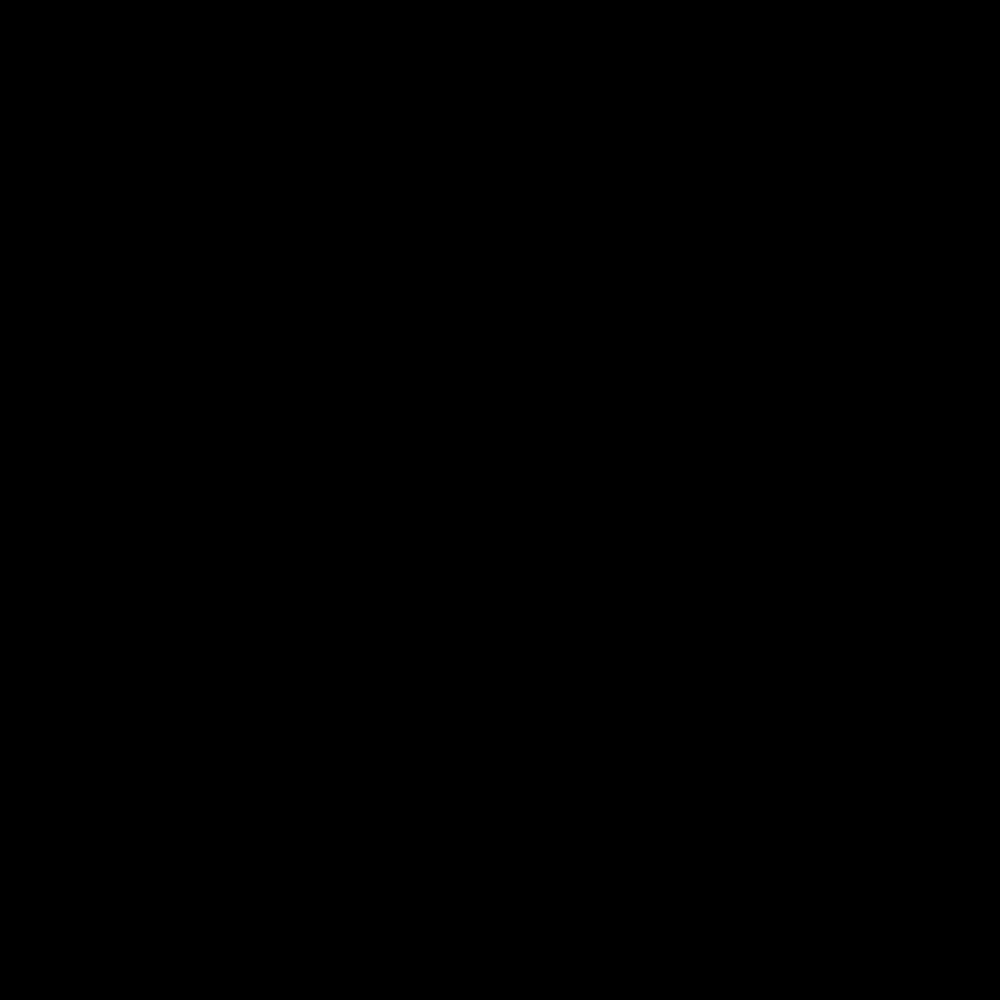

KeyboardInterrupt: 

In [31]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,10))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []
while True:
    fig = plt.gcf()
    ax1 = fig.add_subplot(1, 1, 1)
    
    frame0 = cam0.get_frame(100)

    img = ax1.imshow(frame0)
    fig.colorbar(img)
    mx = guess_centroid(frame0)

    ax1.scatter(x=xref, y=yref, marker='x',
     color='g', label = 'Ref: (%.1f, %.1f)' %(xref, yref))
    
    ax1.scatter(x=mx[1], y=mx[0], marker='x',
     color='r', label = '(%.1f, %.1f)' %(mx[0], mx[1]))
    ax1.legend()

    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    plt.clf()

<IPython.core.display.Javascript object>


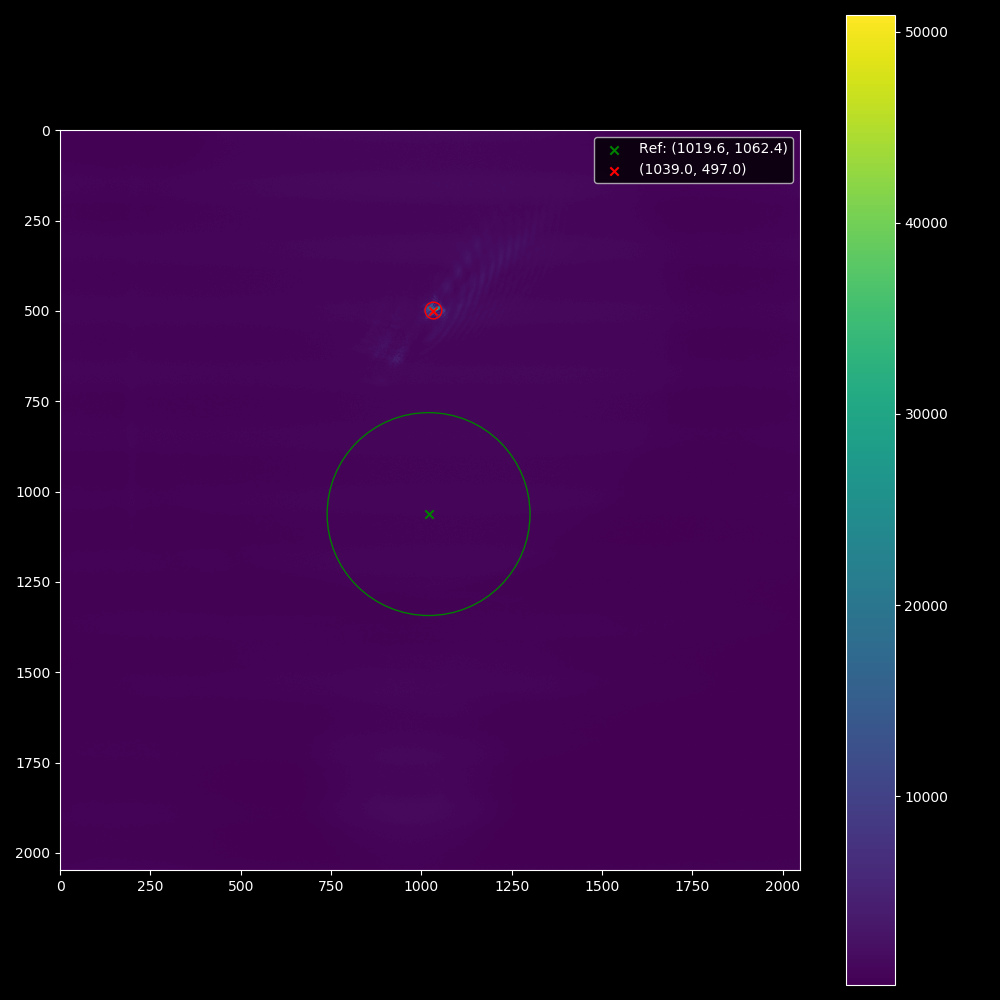

KeyboardInterrupt: 

In [59]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,10))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []
while True:
    fig = plt.gcf()
    ax1 = fig.add_subplot(1, 1, 1)
    
    frame0 = cam0.get_frame(100)

    img = ax1.imshow(frame0)
    fig.colorbar(img)
    mx = guess_centroid(frame0)
 
    ax1.scatter(x=xref, y=yref, marker='x',
     color='g', label = 'Ref: (%.1f, %.1f)' %(xref, yref))

    circleRef = plt.Circle((xref, yref), radius=rRef, color='g', lw=1, fill=False,
     label = '$\omega = $ %.1f' %rRef)
    ax1.add_artist(circleRef)
    
    bounds = bound_roi(frame0, mx, size = 400)
    imroi = select_roi(frame0, bounds)
    mxroi = guess_centroid(imroi)

    try:
        fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
        sigma_x = fitc[2]
        sigma_y = fitr[2]
        p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]
        fit = fitGauss2d(imroi, p0 = p0)
        pars = make_params(fit);
        p0 = zoom_out(pars, bounds)

    except RuntimeError:
        pass
    
    ax1.scatter(x=p0[1], y=p0[2], marker='x',
     color='r', label = '(%.1f, %.1f)' %(mx[1], mx[0])) 
    
    circle = plt.Circle((p0[1], p0[2]), radius=p0[3], color='r', lw=1, fill=False,
     label = '$\omega, = $ %.1f' %p0[3])
    
#    plot_fit_result(frame0, pars, ax=ax1);
    ax1.add_artist(circle)
    ax1.legend()
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    plt.clf()

<IPython.core.display.Javascript object>


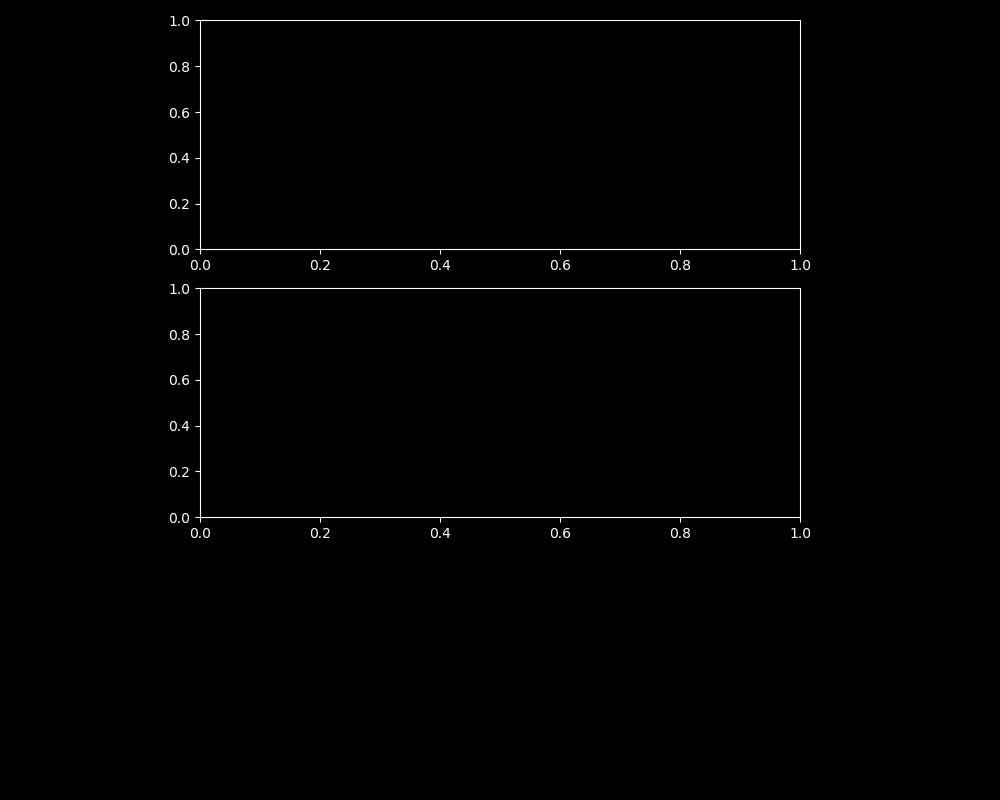

KeyboardInterrupt: 

In [60]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []

frame0 = cam0.get_frame(100)
mx = guess_centroid(frame0)
bounds = bound_roi(frame0, mx, size = 400)
imroi = select_roi(frame0, bounds)
mxroi = guess_centroid(imroi)
fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
sigma_x = fitc[2]
sigma_y = fitr[2]
p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]

while True:
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(3, 1, 1)
    ax2 = fig.add_subplot(3, 1, 2)

    frame0 = cam0.get_frame(100)
    
    mx = guess_centroid(frame0)
    bounds = bound_roi(frame0, mx, size = 400)
    imroi = select_roi(frame0, bounds)
    try:
        fit = fitGauss2d(imroi, p0 = p0)
        pars = make_params(fit);
        if (pars[3] > 0 ) and (pars[3] < 300):
            sx.append(pars[3])
        ax2.plot(sx, label='$w$')
        #ax2.set_ylim(15, 25)
        ax2.legend()
    
    except RuntimeError:
        pass
    
    pars = zoom_out(pars, bounds)
    plot_fit_result(frame0, pars, ax=ax1);
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...    

In [54]:
frame0 = cam0.get_frame(100)
mx = guess_centroid(frame0)

ax1.add_artist(circleRef)

bounds = bound_roi(frame0, mx, size = 400)
imroi = select_roi(frame0, bounds)
mxroi = guess_centroid(imroi)


fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
sigma_x = fitc[2]
sigma_y = fitr[2]
p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]
fit = fitGauss2d(imroi, p0 = p0)
pars = make_params(fit);
p0 = zoom_out(pars, bounds)

In [55]:
p0[3], rRef

(280.11309598101514, 280.7183325525021)

##### The distance 2f is now 80 cm as it should be
Waist size conserved up to 1 px

# Find distance z to galvo: move mirrors and check image stays put 

In [75]:
p1 = [-1800, 0] # p1
p2 = [-3100, 0] # p2
p3 = [-4800, 0] # p3
p0 = [0,0]
p4 = [+1500, 0] # p4
p5 = [+3000, 0] # p5
p6 = [+900, 0] # p6
p7 = [-800, 0] # p7

r1 = [0, 600] # r1
r2 = [0, 1500] # r2
r3 = [0, -800] # r1
r4 = [0, -1500] # r1

hpoints = [p4, p6, p0, p7, p1, p2]
vpoints = [r2, r1, p0, r3, r4]

for hp in vpoints:
    move_to_positionXY(serialport, position=hp, center=center0, wait=3)

In [76]:
for hp in hpoints:
    move_to_positionXY(serialport, position=hp, center=center0, wait=0.1)
    
for hp in vpoints:
    move_to_positionXY(serialport, position=hp, center=center0, wait=0.1)

In [62]:
move_to_positionXY(serialport, position=hpoints[2], center=center0, wait=3)

In [63]:
fitsV, fitsH = [], []

## Move every component 12.5 mm further, z = 412.5 mm 

##### So L1 and CAM at 24, L2 at 0 mm

[334.29470112656014, 1655.6828326607265]
[544.273275860513, 1643.1690522161114]
[865.4509405523496, 1651.231672914102]
[1131.397488383111, 1670.8501358901467]
[490.474570296454, 1109.0131433668291]
[491.2196034724218, 878.4089983633291]


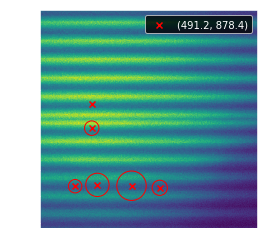

In [66]:
%matplotlib inline
fitsh = []
for hp in hpoints:
    move_to_positionXY(serialport, position=hp, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(frameh, flag_p=False)
    fitsh.append(bestfit1)
    
    plot_fit_result(frameh, bestfit1)
    
    print(bestfit1[1:3])
    sleep(3)
fitsH.append(fitsh)

[484.79717619097465, 737.5344761921205]
[843.9967616081519, 1986.3224251174024]
[859.5672243384946, 1645.7039025005888]
[854.7268799596555, 1199.5087102779148]
[856.9411384939317, 776.901948404395]


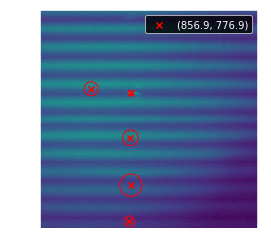

In [67]:
%matplotlib inline
fitsv = []
for vp in vpoints:
    move_to_positionXY(serialport, position=vp, center=center0)
    sleep(1)
    
    framev = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(framev, flag_p=False)
    fitsv.append(bestfit1)
    
    plot_fit_result(framev, bestfit1)

    print(bestfit1[1:3])
    sleep(3)
fitsV.append(fitsv)

## Displacer center, z = 400 mm

##### Every component displacer scale on 12.5 mm (scale center)

[338.9874849688149, 1648.9193794857638]
[537.112667091528, 1670.1127240604428]
[856.520883802539, 1677.6090357968026]
[1132.039370844984, 1673.6928879151924]
[525.0273245877997, 793.4085216900426]
[501.34504207149723, 940.4949793888297]


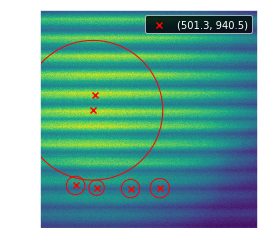

In [68]:
%matplotlib inline
fitsh = []
for hp in hpoints:
    move_to_positionXY(serialport, position=hp, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(frameh, flag_p=False)
    fitsh.append(bestfit1)
    
    plot_fit_result(frameh, bestfit1)
    print(bestfit1[1:3])
    sleep(3)
fitsH.append(fitsh)

[505.58127933054476, 945.5999495011479]
[841.567061520185, 1999.8386689140284]
[854.4568238768161, 1659.7608976584488]
[866.1626039496316, 1195.167092721404]
[880.4201965279101, 819.9243716000154]


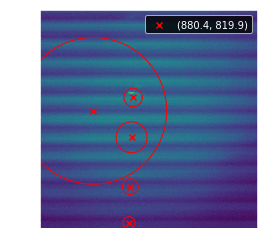

In [69]:
%matplotlib inline
fitsv = []
for vp in vpoints:
    move_to_positionXY(serialport, position=vp, center=center0)
    sleep(1)
    
    framev = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(framev, flag_p=False)
    fitsv.append(bestfit1)
    
    plot_fit_result(framev, bestfit1)
    print(bestfit1[1:3])
    sleep(3)
fitsV.append(fitsv)

## Plot results 

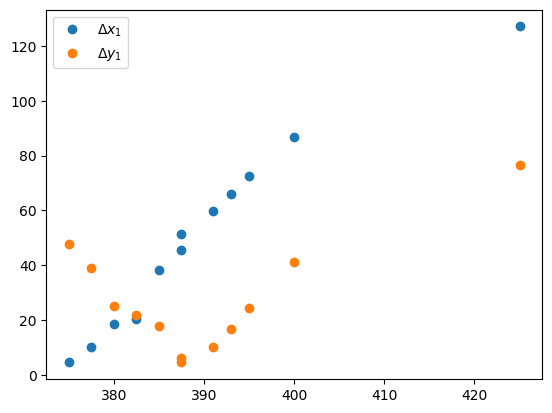

In [192]:
z = [425, 400, 395, 393, 391, 387.5, 387.5, 385, 382.5, 380, 377.5, 375]

sizesV = [np.matrix(f)[1, 3] - np.matrix(f)[2,3] for f in fitsV]
sizesH = [np.matrix(f)[1, 3] - np.matrix(f)[2,3] for f in fitsH]

dy1  = [np.std(np.matrix(f)[:,2]) for f in fitsV]
dx1  = [np.std(np.matrix(f)[:,1]) for f in fitsH]

plt.style.use('default')
#plt.plot(z, sizesH, 'X', label='$w_H$')
#plt.plot(z, sizesV, 'X', label='$w_V$')

plt.plot(z, dx1, 'o', label='$\Delta x_1$')
plt.plot(z, dy1, 'o', label='$\Delta y_1$')

plt.legend()

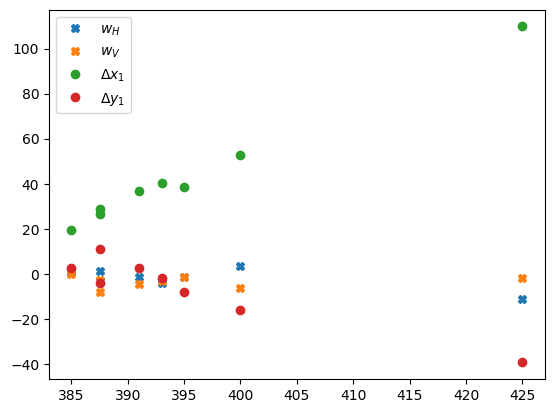

In [146]:
sizesV = [np.matrix(f)[1, 3] - np.matrix(f)[2,3] for f in fitsV]
sizesH = [np.matrix(f)[1, 3] - np.matrix(f)[2,3] for f in fitsH]

dy1 = [np.matrix(f)[1, 2] - np.matrix(f)[2,2] for f in fitsV]
dx1 = [np.matrix(f)[1, 1] - np.matrix(f)[2,1] for f in fitsH]

dy2 = [np.matrix(f)[3, 2] - np.matrix(f)[2,2] for f in fitsV]
dx2 = [np.matrix(f)[3, 1] - np.matrix(f)[2,1] for f in fitsH]


plt.style.use('default')
plt.plot(z, sizesH, 'X', label='$w_H$')
plt.plot(z, sizesV, 'X', label='$w_V$')

plt.plot(z, dx1, 'o', label='$\Delta x_1$')
plt.plot(z, dy1, 'o', label='$\Delta y_1$')

#plt.plot(z, dx2, 'o', label='$\Delta x_2$')
#plt.plot(z, dy2, 'o', label='$\Delta y_2$')
plt.legend()

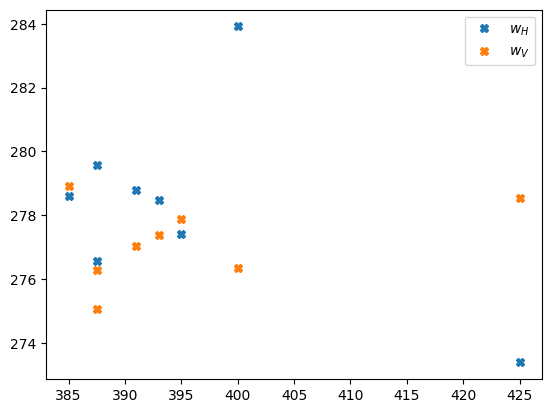

In [149]:
sizesV = [np.matrix(f)[1, 3] for f in fitsV]
sizesH = [np.matrix(f)[1, 3] for f in fitsH]


plt.style.use('default')
plt.plot(z, sizesH, 'X', label='$w_H$')
plt.plot(z, sizesV, 'X', label='$w_V$')


plt.legend()

In [125]:
rRef

280.7183325525021

In [148]:
fitsv[-1][3]

278.62181566838734

# Dichroic at 30cm from L2

In [127]:
rmax = [(0,0), (0, 2500), (0,-2800), (-4200, 0), (4200, 0)]
rhalf = [(0, 1250), (0, -1400), (-2100, 0), (2100, 0)]

In [128]:
fitsV2, fitsH2 = [], []

## OB = 25mm

(651, 1021)
(440, 1030)
(981, 1011)
(648, 1431)
(681, 603)
(525, 1023)
(860, 973)
(651, 1219)
(652, 828)


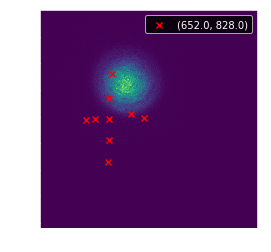

In [129]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 23mm

(651, 749)
(443, 756)
(980, 738)
(649, 1155)
(686, 340)
(527, 748)
(860, 699)
(650, 945)
(653, 556)


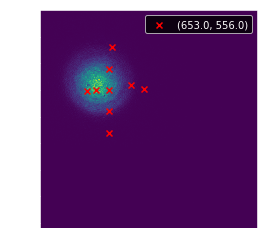

In [130]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 21mm

(653, 750)
(403, 749)
(958, 722)
(651, 1139)
(659, 361)
(534, 750)
(783, 747)
(653, 937)
(724, 509)


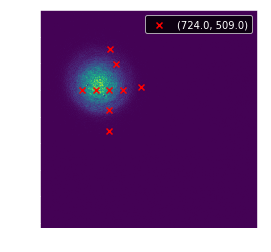

In [131]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 19mm

(657, 752)
(488, 703)
(946, 735)
(653, 1124)
(658, 377)
(545, 752)
(776, 749)
(654, 931)
(656, 578)


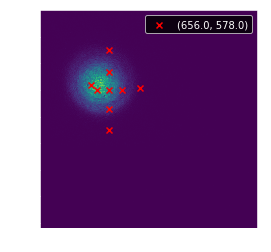

In [133]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 17mm

(657, 755)
(503, 704)
(933, 744)
(654, 1103)
(659, 392)
(555, 755)
(770, 752)
(653, 921)
(659, 586)


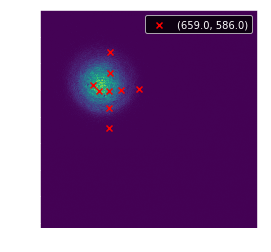

In [134]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 15mm

(659, 754)
(455, 755)
(918, 756)
(653, 1089)
(706, 407)
(566, 755)
(850, 746)
(682, 902)
(658, 594)


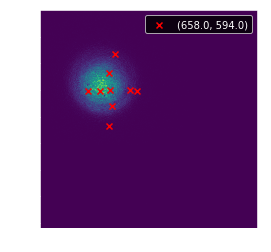

In [135]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 13mm

(662, 758)
(537, 706)
(893, 737)
(653, 1075)
(696, 427)
(576, 759)
(754, 751)
(656, 909)
(663, 601)


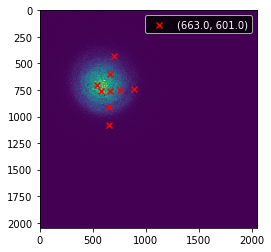

In [137]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 11mm

(662, 755)
(560, 705)
(875, 736)
(657, 1059)
(659, 446)
(584, 762)
(811, 705)
(661, 899)
(661, 613)


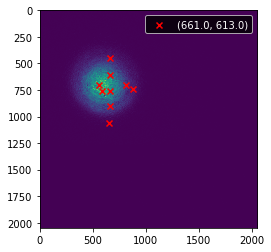

In [139]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 9mm

(662, 757)
(574, 707)
(861, 737)
(741, 1008)
(663, 464)
(594, 757)
(740, 754)
(661, 895)
(666, 619)


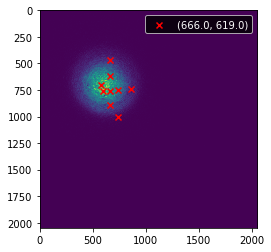

In [141]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 7mm

(665, 759)
(528, 761)
(844, 736)
(659, 1023)
(664, 481)
(601, 761)
(731, 757)
(662, 890)
(664, 627)


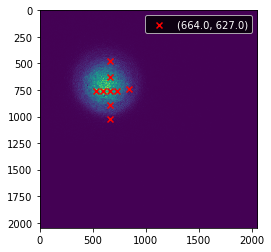

In [143]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 5mm

(701, 699)
(608, 698)
(876, 643)
(746, 1041)
(664, 486)
(693, 720)
(723, 749)
(664, 865)
(726, 633)


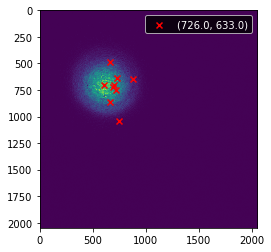

In [172]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 3mm

(667, 755)
(562, 754)
(807, 727)
(707, 995)
(664, 503)
(699, 719)
(782, 732)
(782, 863)
(692, 635)


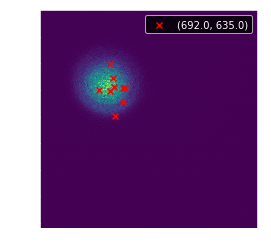

In [173]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 1mm

(690, 747)
(642, 737)
(792, 727)
(708, 980)
(665, 519)
(710, 719)
(708, 745)
(694, 835)
(690, 644)


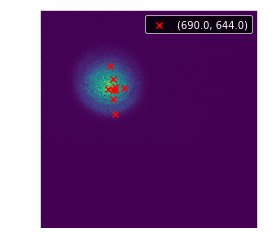

In [174]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 0mm

(705, 754)
(649, 745)
(784, 726)
(663, 960)
(666, 530)
(626, 713)
(780, 728)
(664, 857)
(696, 632)


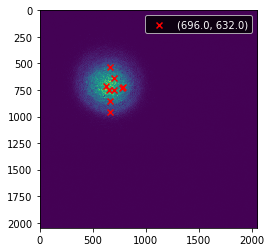

In [177]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## Plot results

In [109]:
np.matrix(fitsH2[0])[1,0]

1171

In [151]:
fitsH2

[[[1021, 651, 22044],
  [1030, 440, 19395],
  [1011, 981, 22695],
  [1431, 648, 20340],
  [603, 681, 22927],
  [1023, 525, 22126],
  [973, 860, 21591],
  [1219, 651, 21191],
  [828, 652, 20739]],
 [[749, 651, 22076],
  [756, 443, 19315],
  [738, 980, 23355],
  [1155, 649, 19881],
  [340, 686, 22746],
  [748, 527, 21857],
  [699, 860, 22168],
  [945, 650, 21156],
  [556, 653, 21118]],
 [[750, 653, 21497],
  [749, 403, 19689],
  [722, 958, 21526],
  [1139, 651, 19224],
  [361, 659, 22413],
  [750, 534, 20819],
  [747, 783, 22265],
  [937, 653, 21775],
  [509, 724, 20803]],
 [[752, 657, 20257],
  [703, 488, 19181],
  [735, 946, 21033],
  [1124, 653, 19207],
  [377, 658, 22993],
  [752, 545, 19723],
  [749, 776, 21157],
  [931, 654, 21448],
  [578, 656, 22112]],
 [[755, 657, 21787],
  [704, 503, 19580],
  [744, 933, 21990],
  [1103, 654, 20863],
  [392, 659, 23872],
  [755, 555, 19877],
  [752, 770, 20946],
  [921, 653, 21898],
  [586, 659, 21104]],
 [[754, 659, 21383],
  [755, 455, 19240]

In [179]:
len(fitsH2)

14

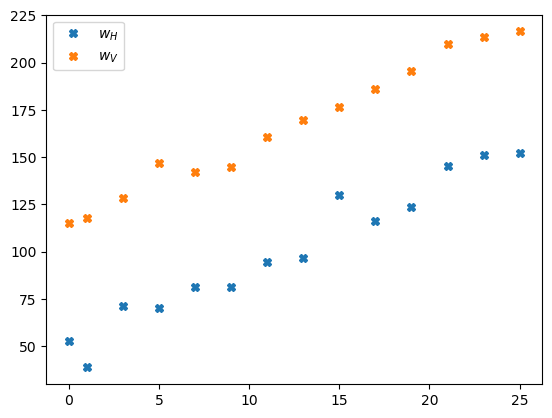

In [178]:
z = [25, 23, 21, 19, 17, 15, 13, 11, 9, 7, 5, 3, 1, 0] 

dx1 = [np.std(np.matrix(f)[:, 0]) for f in fitsH2]
dy1 = [np.std(np.matrix(f)[:, 1]) for f in fitsH2]

plt.style.use('default')
plt.plot(z, dy1, 'X', label='$w_H$')
plt.plot(z, dx1, 'X', label='$w_V$')

plt.legend()

# Dichroic at 27.5cm from L2

## OB = 25mm

(689, 1224)
(621, 1242)
(760, 1215)
(737, 1394)
(661, 1036)
(664, 1224)
(745, 1251)
(660, 1318)
(661, 1142)


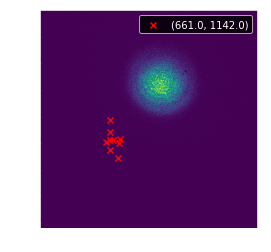

In [187]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 21mm

(718, 982)
(695, 945)
(744, 940)
(684, 1137)
(662, 778)
(675, 949)
(680, 971)
(653, 1008)
(720, 878)


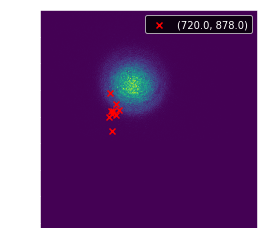

In [188]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 17mm

(652, 925)
(704, 941)
(723, 969)
(738, 1065)
(662, 799)
(650, 925)
(659, 922)
(661, 1016)
(654, 852)


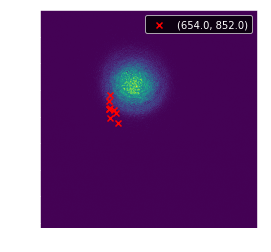

In [189]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 13mm

(670, 948)
(744, 950)
(676, 936)
(669, 1070)
(667, 835)
(666, 917)
(649, 964)
(668, 1011)
(668, 898)


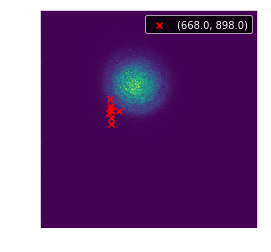

In [190]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 9mm

(672, 922)
(720, 927)
(631, 842)
(746, 1049)
(673, 857)
(725, 915)
(634, 943)
(651, 924)
(674, 911)


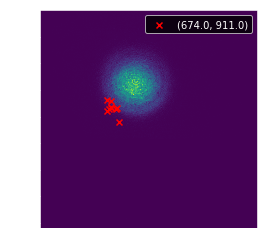

In [191]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 7mm

(672, 919)
(757, 907)
(626, 987)
(737, 945)
(738, 943)
(733, 912)
(746, 901)
(699, 960)
(677, 918)


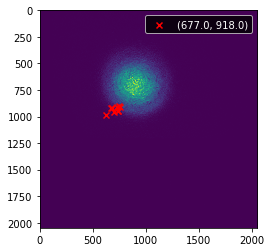

In [197]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 5mm

(625, 895)
(755, 942)
(610, 984)
(698, 980)
(675, 887)
(675, 896)
(675, 896)
(676, 934)
(675, 910)


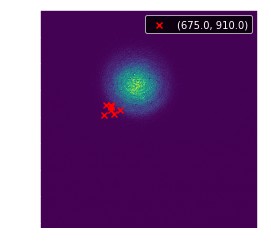

In [198]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 3mm

(624, 893)
(729, 894)
(589, 915)
(676, 960)
(704, 907)
(730, 911)
(563, 890)
(671, 916)
(708, 976)


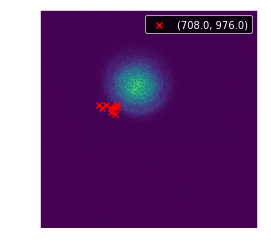

In [199]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## OB = 1mm

(669, 907)
(791, 909)
(572, 915)
(728, 853)
(703, 918)
(735, 909)
(589, 908)
(669, 908)
(733, 851)


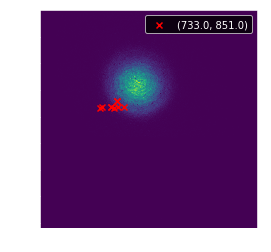

In [200]:
%matplotlib inline
fig, ax = plt.subplots(1)
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[1], bestfit1[0], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[0], y=bestfit1[1], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
fitsH2.append(fitsh)

## Plot results

In [109]:
np.matrix(fitsH2[0])[1,0]

1171

In [151]:
fitsH2

[[[1021, 651, 22044],
  [1030, 440, 19395],
  [1011, 981, 22695],
  [1431, 648, 20340],
  [603, 681, 22927],
  [1023, 525, 22126],
  [973, 860, 21591],
  [1219, 651, 21191],
  [828, 652, 20739]],
 [[749, 651, 22076],
  [756, 443, 19315],
  [738, 980, 23355],
  [1155, 649, 19881],
  [340, 686, 22746],
  [748, 527, 21857],
  [699, 860, 22168],
  [945, 650, 21156],
  [556, 653, 21118]],
 [[750, 653, 21497],
  [749, 403, 19689],
  [722, 958, 21526],
  [1139, 651, 19224],
  [361, 659, 22413],
  [750, 534, 20819],
  [747, 783, 22265],
  [937, 653, 21775],
  [509, 724, 20803]],
 [[752, 657, 20257],
  [703, 488, 19181],
  [735, 946, 21033],
  [1124, 653, 19207],
  [377, 658, 22993],
  [752, 545, 19723],
  [749, 776, 21157],
  [931, 654, 21448],
  [578, 656, 22112]],
 [[755, 657, 21787],
  [704, 503, 19580],
  [744, 933, 21990],
  [1103, 654, 20863],
  [392, 659, 23872],
  [755, 555, 19877],
  [752, 770, 20946],
  [921, 653, 21898],
  [586, 659, 21104]],
 [[754, 659, 21383],
  [755, 455, 19240]

In [195]:
len(fitsH2)

19

In [194]:
len(z2)

22

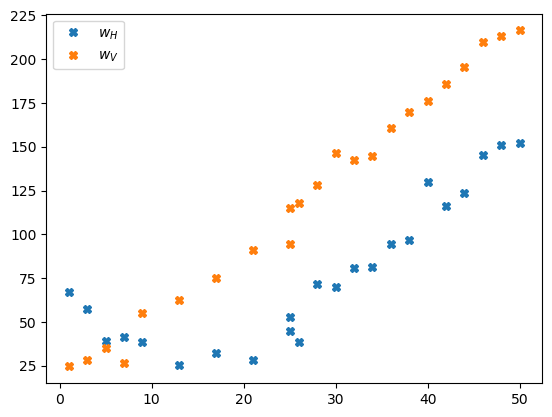

In [201]:
z = [25, 23, 21, 19, 17, 15, 13, 11, 9, 7, 5, 3, 1, 0]
z = [i+25 for i in z]
z2 = z+ [25, 21, 17, 13, 9, 7, 5, 3, 1]

dx1 = [np.std(np.matrix(f)[:, 0]) for f in fitsH2]
dy1 = [np.std(np.matrix(f)[:, 1]) for f in fitsH2]

plt.style.use('default')
plt.plot(z2, dy1, 'X', label='$w_H$')
plt.plot(z2, dx1, 'X', label='$w_V$')

plt.legend()

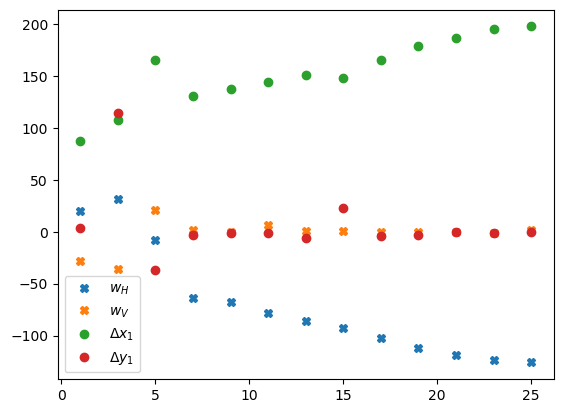

In [176]:
z = [25, 23, 21, 19, 17, 15, 13, 11, 9, 7, 5, 3, 1, 0]

dx1 = [np.matrix(f)[5, 0] - np.matrix(f)[0,0] for f in fitsH2]
dy1 = [np.matrix(f)[5, 1] - np.matrix(f)[0,1] for f in fitsH2]
dx2 = [np.matrix(f)[7, 0] - np.matrix(f)[0,0] for f in fitsH2]
dy2 = [np.matrix(f)[7, 1] - np.matrix(f)[0,1] for f in fitsH2]

plt.style.use('default')
plt.plot(z, dy1, 'X', label='$w_H$')
plt.plot(z, dx1, 'X', label='$w_V$')

plt.plot(z, dx2, 'o', label='$\Delta x_1$')
plt.plot(z, dy2, 'o', label='$\Delta y_1$')

plt.legend()

## Try with same galvo shifts in x and y (not fair to compare otherwise) 

In [164]:
p1 = [-1500, 0] # p1
p0 = [0,0]
p4 = [+1500, 0] # p4
p6 = [+750, 0] # p6
p7 = [-750, 0] # p7

r1 = [0, 750] # r1
r2 = [0, 1500] # r2
r3 = [0, -750] # r1
r4 = [0, -1500] # r1

hpoints = [p4, p6, p0, p7, p1]
vpoints = [r2, r1, p0, r3, r4]

In [172]:
import cv2

ModuleNotFoundError: No module named 'cv2'

[1389.4853672060744, 1014.9277201587491]
[1363.5932020762207, 1014.8796293509059]
[1338.985010161009, 1014.8124204379701]
[1314.2643496181222, 1014.6865582573895]
[1288.974272841901, 1014.6441549143769]


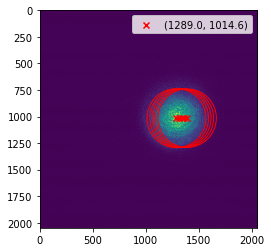

In [173]:
%matplotlib inline
fitsh = []
for hp in hpoints:
    move_to_positionXY(serialport, position=hp, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(frameh, flag_p=False)
    fitsh.append(bestfit1)
    
    plot_fit_result(frameh, bestfit1)
    print(bestfit1[1:3])
fitsH2.append(fitsh)

[1337.3291386486408, 1011.9202353540272]
[1338.5020325740604, 1014.6374858857727]
[1338.8007786451872, 1014.9647578966983]
[1339.0916557768285, 1015.3166319799903]
[1340.1030252950313, 1018.3405825117541]


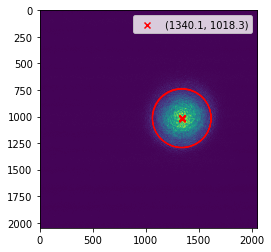

In [174]:
%matplotlib inline
fitsv = []
for vp in vpoints:
    move_to_positionXY(serialport, position=vp, center=center0)
    sleep(1)
    
    framev = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(framev, flag_p=False)
    fitsv.append(bestfit1)
    
    plot_fit_result(framev, bestfit1)
    print(bestfit1[1:3])
fitsV2.append(fitsv)

In [177]:
np.arctan(3/370) 

0.008107930435610665

# Try with microscope objective 

In [231]:
move_to_positionXY(serialport, position=(0, 0), center=center0)

In [236]:
for i in range(20):
    for i in range(-3000, 3000, 100):
        move_to_positionXY(serialport, position=(0,i), center=center0, wait=0.01)

In [229]:
for i in range(-5000, 5000, 100):
    move_to_positionXY(serialport, position=(i, 0), center=center0, wait=0.1)
    

In [171]:
move_to_positionXY(serialport, position=hpoints[2], center=center0)

###### Covering the whole diameter of the lens 1, after the objective the beam moves about 1 mm 

<IPython.core.display.Javascript object>


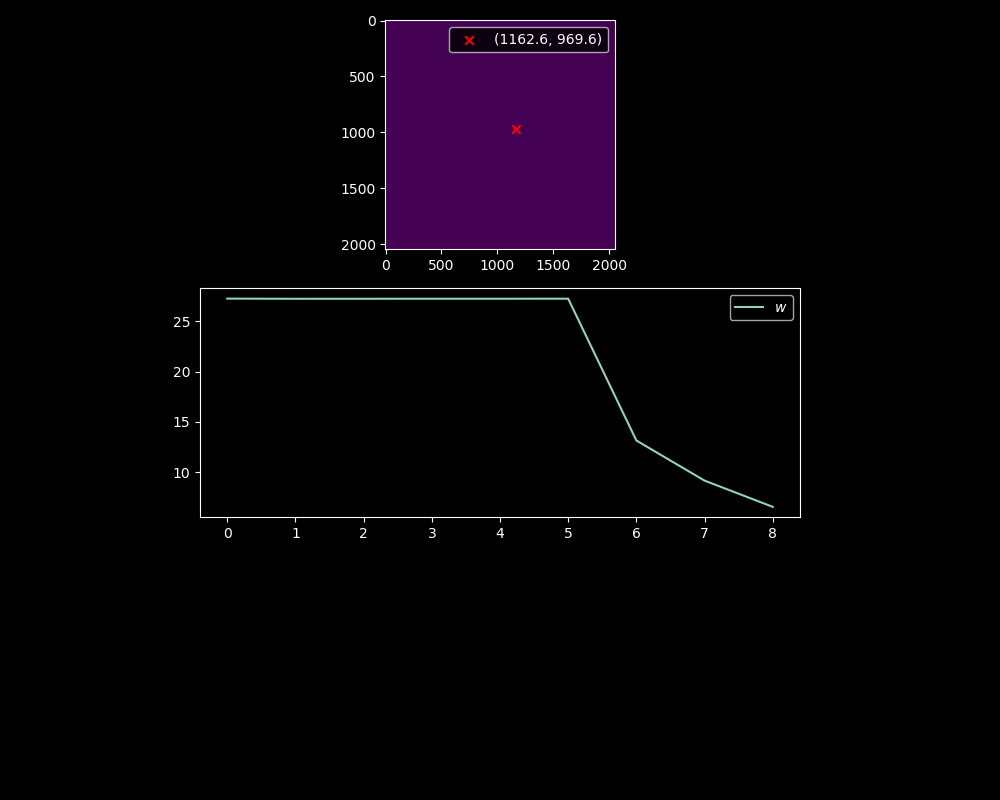

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


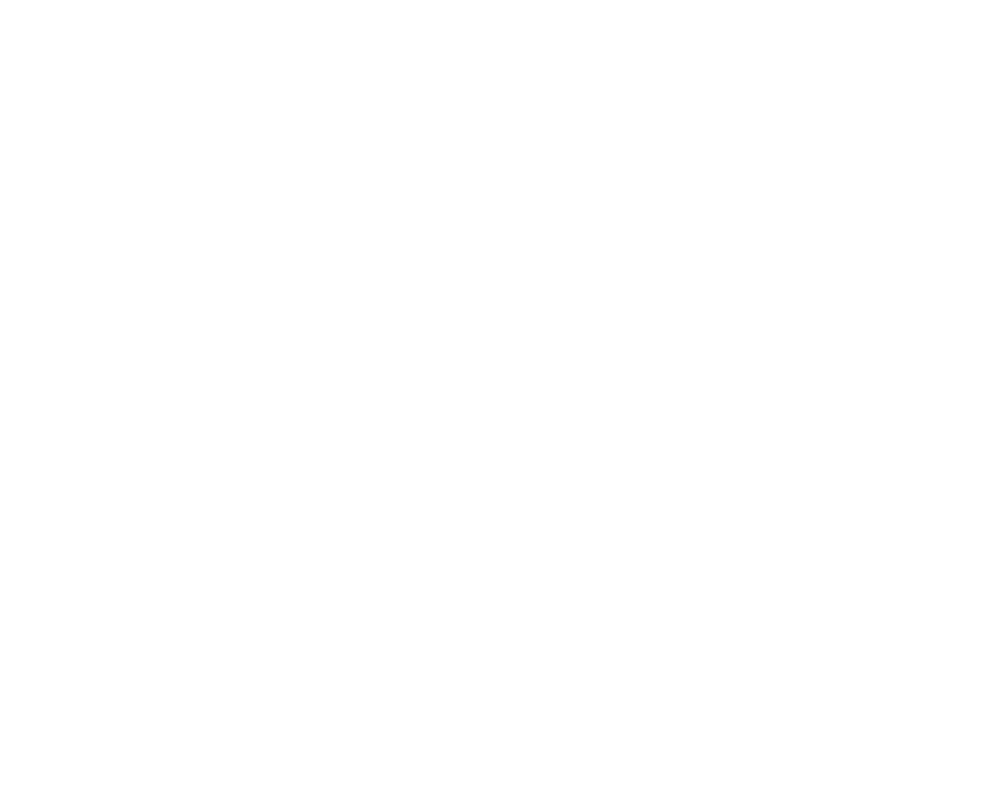

In [737]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
sx, sy = [], []

frame0 = cam0.get_frame(100)
mx = guess_centroid(frame0)
bounds = bound_roi(frame0, mx, size = 400)
imroi = select_roi(frame0, bounds)
mxroi = guess_centroid(imroi)
fitr, fitc = fitGausRowCol(imroi, mxroi, flag_p=False)
sigma_x = fitc[2]
sigma_y = fitr[2]
p0 = [imroi.max(), mxroi[1], mxroi[0], sigma_x, sigma_y]

while True:
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(3, 1, 1)
    ax2 = fig.add_subplot(3, 1, 2)

    frame0 = cam0.get_frame(100)
    
    mx = guess_centroid(frame0)
    bounds = bound_roi(frame0, mx, size = 400)
    imroi = select_roi(frame0, bounds)
    try:
        fit = fitGauss2d(imroi, p0 = p0)
        pars = make_params(fit);
        if (pars[3] > 0 ) and (pars[3] < 200):
            sx.append(pars[3])
        ax2.plot(sx, label='$w$')
        #ax2.set_ylim(15, 25)
        ax2.legend()
    
    except RuntimeError:
        pass
    
    pars = zoom_out(pars, bounds)
    plot_fit_result(frame0, pars, ax=ax1);
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...    

[88226.16632183695,
 1159.3085846483298,
 970.972624136498,
 7.54652648951606,
 0.0011435250159100398]

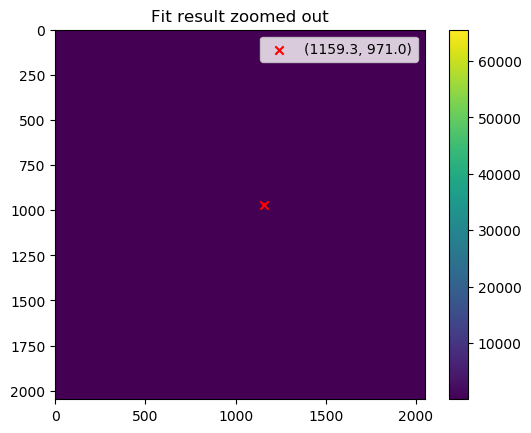

In [738]:
%matplotlib inline
plt.style.use('default')
frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

guessNfitGaussian2d(frame, flag_p=True)

In [253]:
io.imsave('objective_focus_4f.tiff', frame0)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: objective_focus_4f.tiff is a low contrast image
  warn('%s is a low contrast image' % fname)


## Measure displacements along the whole lens diameter  

In [676]:
fitsHo = []

In [8]:
rmax = [(0,0), (0, 2500), (0,-2800), (-4200, 0), (4200, 0)]
rhalf = [(0, 1250), (0, -1400), (-2100, 0), (2100, 0)]

In [512]:
rreal = np.array([18, 22, 22, 20, 10, 10, 10, 10])
beta1 = np.arctan(rreal/400)
beta1

array([0.04496966, 0.05494464, 0.05494464, 0.0499584 , 0.02499479,
       0.02499479, 0.02499479, 0.02499479])

### Plot results 

In [730]:
zs = [0, 5, 10, 15, 16.5, 18, 20, 21.5, 22.5, 23.5, 25, 27]

In [808]:
#zs = np.arange(0, len(fitsHo), dtype=float) *5
px = 6.5e-3  # Pixel size
betaRatioAv = []
intAv = []
for zi in range(len(zs)): # zi iterates over positions in z
    r0 = np.array(fitsHo[zi])[0,:2]
    betaRatio = []
    for pi in range(1,3): # 9 points each zi
        r = np.sqrt((np.matrix(fitsHo[zi])[pi,0]-r0[0])**2 + (np.matrix(fitsHo[zi])[pi,1]-r0[1])**2)
        beta2 = np.arctan(r * px / 30)
        betaRatio.append(beta2/beta1[pi-1])
    betaRatioAv.append((np.average(betaRatio), np.std(betaRatio)))
    intAv.append((np.average(np.matrix(fitsHo[zi])[1:,2]), np.std(np.matrix(fitsHo[zi])[1:,2])))

intAv = np.matrix(intAv)
betaRatios = np.matrix(betaRatioAv)

C:\Users\IFIc\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Support for passing a (n, 1)-shaped error array to errorbar() is deprecated since Matplotlib 3.1 and will be removed in 3.3; pass a 1D array instead.
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0, 0.5, '$\\beta_2/\\beta_1$')

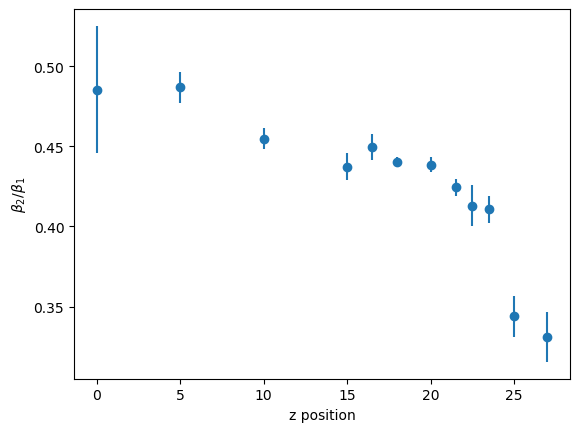

In [806]:
plt.style.use('default')

plt.errorbar(x=zs, y=betaRatios[:,0], yerr=betaRatios[:,1], fmt='o')
plt.xlabel('z position')
plt.ylabel('$\\beta_2/\\beta_1$')

C:\Users\IFIc\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Support for passing a (n, 1)-shaped error array to errorbar() is deprecated since Matplotlib 3.1 and will be removed in 3.3; pass a 1D array instead.
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0, 0.5, 'Avg intensity')

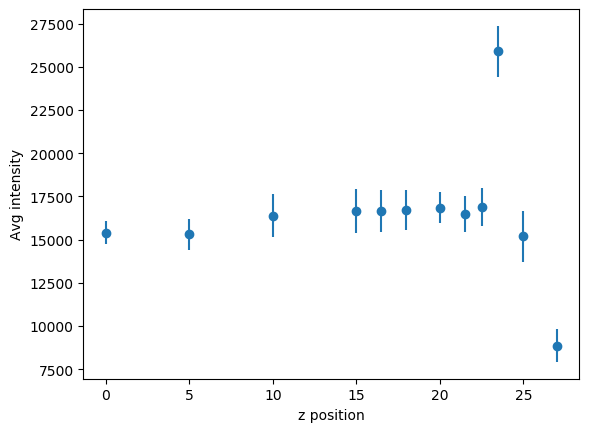

In [809]:
plt.style.use('default')

plt.errorbar(x=zs, y=intAv[:,0], yerr=intAv[:,1], fmt='o')
plt.xlabel('z position')
plt.ylabel('Avg intensity')

In [810]:
intAv[:,1]

matrix([[ 678.16986027],
        [ 902.4364157 ],
        [1252.3127355 ],
        [1276.45681478],
        [1232.27287461],
        [1166.10162507],
        [ 879.40249602],
        [1057.18694391],
        [1114.06748421],
        [1479.37740283],
        [1461.56734685],
        [ 946.59263116]])

## Scan and fit whole grid

##### zOb = 10 mm, zCAM = 15 mm

### Check intensity variation without moving galvos

In [734]:
move_to_positionXY(serialport, position=[0,0], center=center0)

(970, 1158)
(970, 1158)
(970, 1158)
(970, 1158)
(970, 1158)
(970, 1158)
(970, 1158)
(970, 1158)
(970, 1158)


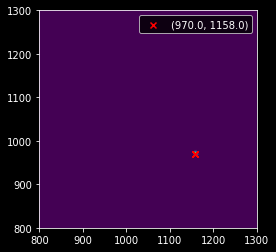

In [741]:
%matplotlib inline
plt.style.use('dark_background')
fig, ax = plt.subplots(1)

fitsh = []
for i in rmax+rhalf:
    #move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[0], bestfit1[1], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[1], y=bestfit1[0], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
    ax.set_xlim(800, 1300)
    ax.set_ylim(800, 1300)

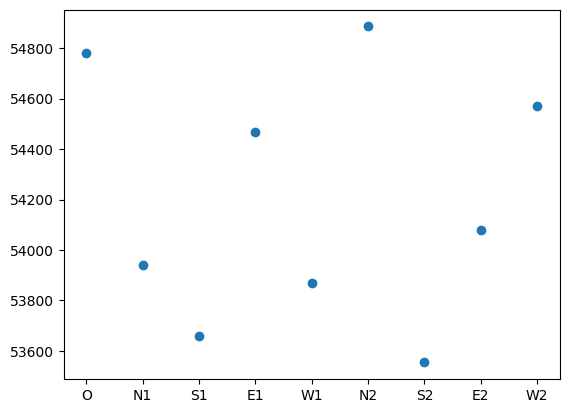

In [742]:
coords = ['O','N1', 'S1', 'E1', 'W1', 'N2', 'S2', 'E2', 'W2']
ints = np.array(np.matrix(fitsh).T[2])[0]
plt.style.use('default')
fig, ax = plt.subplots(1)
ax.plot(coords, ints, 'o')

In [744]:
uInt_sys = np.std(ints)

In [745]:
uInt_sys

461.57286117452736

##### This is the systematic variation of the maximum intensity

### Define whole grid

In [9]:
xscan = [-2100, -1050, 0, 1050, 2100]
yscan = [-1400, -600, 0, 600, 1400]

In [10]:
for xx in xscan:
    for yy in yscan:
        move_to_positionXY(serialport, position=[xx, yy], center=center0)
        sleep(0.5)

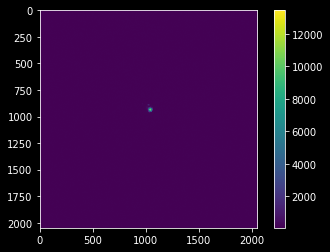

In [803]:
move_to_positionXY(serialport, position=[2100, 1400], center=center0)

frame = cam0.get_frame(100)

gray = plt.imshow(frame)
plt.colorbar(gray)

(936, 1034)
(1010, 953)
(989, 955)
(974, 951)
(957, 954)
(936, 951)
(1011, 970)
(990, 971)
(974, 972)
(951, 971)
(932, 974)
(1011, 991)
(991, 995)
(974, 992)
(958, 993)
(936, 992)
(1012, 1012)
(989, 1017)
(972, 1015)
(958, 1013)
(938, 1017)
(1012, 1037)
(992, 1038)
(974, 1033)
(958, 1033)


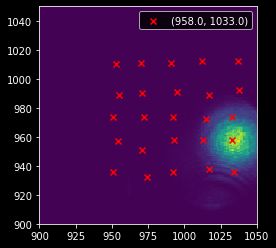

In [804]:
%matplotlib inline
plt.style.use('dark_background')
fig, ax = plt.subplots(1)

fitsh = []
for xx in xscan:
    for yy in yscan:
        move_to_positionXY(serialport, position=[xx, yy], center=center0, wait=2)
    
        frameh = cam0.get_frame(100)
        ax.imshow(frameh)
        bestfit1 = guess_centroid(frameh)
        fitsh.append([bestfit1[0], bestfit1[1], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity

        cross = ax.scatter(x=bestfit1[1], y=bestfit1[0], marker='x',
                           color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
        ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
        print(bestfit1)
        ax.set_xlim(900, 1050)
        ax.set_ylim(900, 1050)
        #ax.set_xlim(1080, 1210)
        #ax.set_ylim(890, 1020)

[770.9660292543838, 486.88922016423726]
[1120.4410292153302, 987.0928980522428]
[1118.0425844475521, 969.3371911198387]
[1117.7772536808807, 949.3884093792867]
[1118.0690713308823, 922.034724309267]
[1143.1104307218607, 1011.1956960702544]
[1139.6053352182305, 989.6839732144015]
[1139.1338351833642, 970.0193634443551]
[1139.1857890116012, 949.3270562502383]
[1139.3790138245981, 921.9194090184584]
[1163.01554013234, 1012.6953191261617]
[1160.6879965526439, 990.6807949381753]
[1160.674684192235, 970.0707940455441]
[1160.721789461809, 949.4999599103412]
[1161.0201244327254, 922.0090423013619]
[1161.0460789709928, 921.9961881255758]
[1182.5263491329665, 990.8501079588232]
[1182.4059541314377, 970.2654264220486]
[1182.4267197617114, 949.481628430788]
[1182.6022848920777, 921.9804773031185]
[1204.1556399289002, 1013.8183312852287]
[1204.2621711605723, 990.9705524357215]
[1204.2879852446954, 970.1634720866813]
[1204.192659050809, 949.5157018823911]
[1204.2966397554897, 922.2290838510767]


(800, 1300)

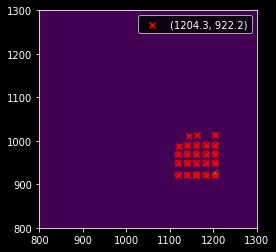

In [769]:
%matplotlib inline
plt.style.use('dark_background')
fig, ax = plt.subplots(1)

fitsh = []
for xx in xscan:
    for yy in yscan:
        move_to_positionXY(serialport, position=[xx, yy], center=center0)
        sleep(1)

        frameh = cam0.get_frame(100)

        bestfit1 = guessNfitGaussian2d(frameh, flag_p=False)
        fitsh.append(bestfit1)

        plot_fit_result(frameh, bestfit1)
        print(bestfit1[1:3])
plt.gca().set_xlim(800, 1300)
plt.gca().set_ylim(800, 1300)

In [782]:
fitsh

[[72.29957073738123,
  770.9660292543838,
  486.88922016423726,
  0.5886787388812265,
  1.3925157665854462],
 [21936.676990365897,
  1120.4410292153302,
  987.0928980522428,
  3.8955766611758005,
  0.004597349508091537],
 [48192.36234054716,
  1118.0425844475521,
  969.3371911198387,
  5.594482305808167,
  0.0020948023648302426],
 [48393.94466567767,
  1117.7772536808807,
  949.3884093792867,
  6.038591948844849,
  0.0020890752682808807],
 [46558.759432169994,
  1118.0690713308823,
  922.034724309267,
  5.9190133458942835,
  0.002172207304220506],
 [1111.6218696385076,
  1143.1104307218607,
  1011.1956960702544,
  2.175015427938075,
  0.09061742708933183],
 [46425.01477355724,
  1139.6053352182305,
  989.6839732144015,
  5.447116655325929,
  0.0021739123451525026],
 [46528.07366491717,
  1139.1338351833642,
  970.0193634443551,
  6.299571713721726,
  0.0021703951412806025],
 [45810.86628366256,
  1139.1857890116012,
  949.3270562502383,
  6.250295484962896,
  0.002206061725557614],
 [4

Text(0, 0.5, 'Intensity')

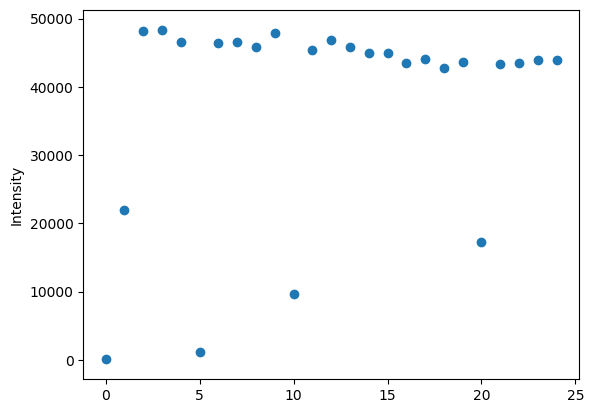

In [788]:
coords = range(25)
ints = np.array(np.matrix(fitsh).T[0])[0]
waists = np.array(np.matrix(fitsh).T[3])[0]

plt.style.use('default')
fig, ax = plt.subplots(1)
ax.errorbar(x=coords, y=ints, yerr=uInt_sys, fmt='o')
ax.set_ylabel('Intensity')

Text(0, 0.5, 'w [px]')

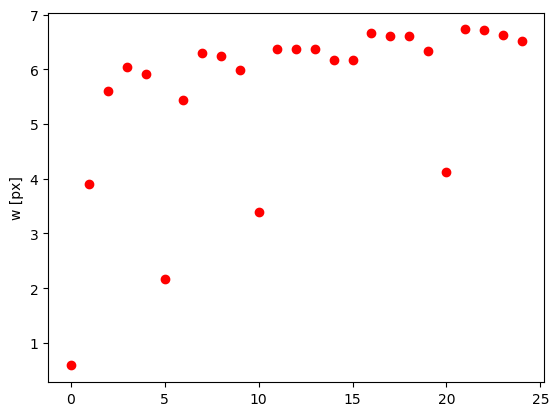

In [790]:
fig, ax = plt.subplots(1)
ax.plot(coords, waists,'ro')
ax.set_ylabel('w [px]')

# Place DM at z = 250 mm from L2, zOb = 0 mm, zCAM = 25 mm, -1 screwhole


[1130.6528275720602, 973.8315337450792]
[1131.082312353736, 890.2575461919563]
[1129.2410904586993, 1069.866659524316]
[1071.9041665365307, 975.8108784016713]
[1032.3126756028746, 973.0225430793241]
[1130.949967696215, 932.4258616888056]
[1130.1097039880578, 1020.1092684055577]
[1130.116689545041, 1020.1461575164103]
[1083.5815245091746, 973.6019522508573]


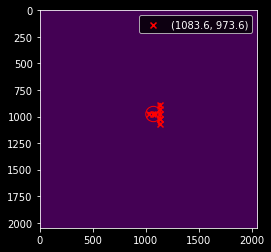

In [448]:
%matplotlib inline
plt.style.use('dark_background')
fitsh = []
for i in rmax+rhalf:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    
    bestfit1 = guessNfitGaussian2d(frameh, flag_p=False)
    fitsh.append(bestfit1)
    
    plot_fit_result(frameh, bestfit1)
    print(bestfit1[1:3])
fitsHo.append(fitsh)

# Microscope scan 

In [39]:
rmax = [(0,0), (0, 2500), (0,-2800), (-4200, 0), (4200, 0)]
rhalf = [(0, 1250), (0, -1400), (-2100, 0), (2100, 0)]
rquart = [(0, 675), (0, -750), (-1050, 0), (1050, 0)]

In [39]:
move_to_positionXY(serialport, position=rmax[0], center=center0)

In [18]:
for i in range(25):
    for i in rmax+rhalf:
        move_to_positionXY(serialport, position=i, center=center0, wait=0.1)

KeyboardInterrupt: 

In [16]:
for i in range(25):
    for i in rquart:
        move_to_positionXY(serialport, position=i, center=center0, wait=0.5)

NameError: name 'rquart' is not defined

1.0


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: position(0, 675).tif is a low contrast image
  warn('%s is a low contrast image' % fname)


1.4881136712966327


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: position(0, -750).tif is a low contrast image
  warn('%s is a low contrast image' % fname)


1.084009357534953


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: position(-1050, 0).tif is a low contrast image
  warn('%s is a low contrast image' % fname)


1.3606713121670195


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: position(1050, 0).tif is a low contrast image
  warn('%s is a low contrast image' % fname)


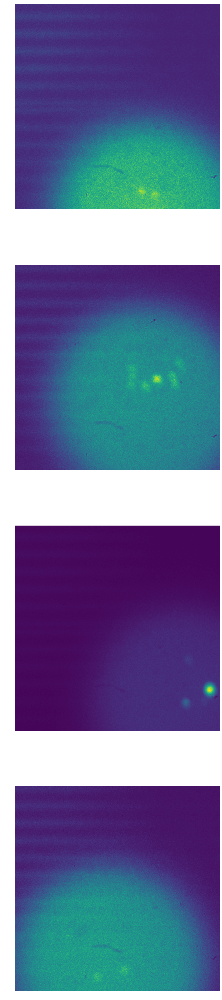

In [212]:
%matplotlib inline
fig, ax = plt.subplots(len(rquart), figsize=(10, 50))
plt.style.use('dark_background')
for j,i in enumerate(rquart):
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    if j == 0:
        int_ref = frameh.sum()
    print(frameh.sum()/int_ref)
    io.imsave('position'+str(i)+'.tif', frameh)
    ax[j].imshow(frameh)

### rquart

In [216]:
range(rquart[1][1], rquart[0][1], 20)

range(-750, 675, 20)

1.0
1.0087083140942825
1.0103704104612468
1.0
1.0103788136414722
1.00880732362995
1.0
1.0040618795317067
1.0111634088399557


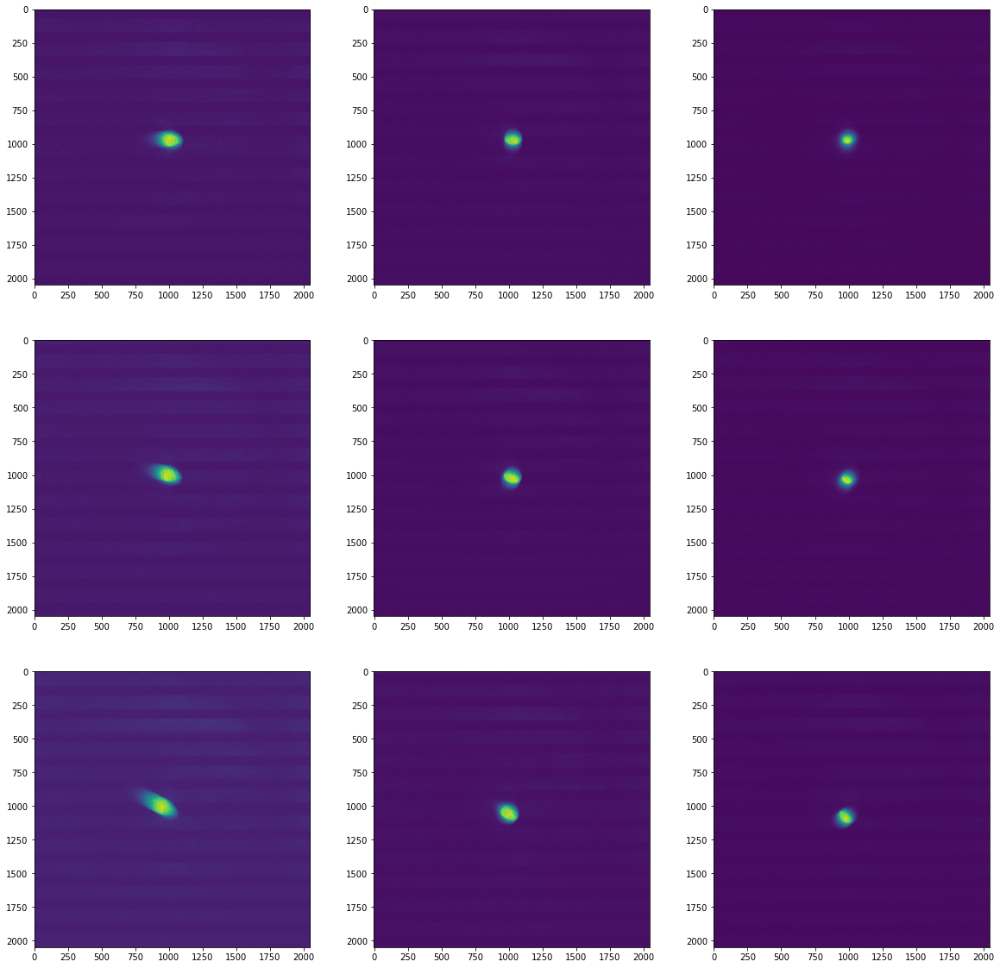

In [38]:
%matplotlib inline
rangey = range(rquart[1][1], rquart[0][1], 500)
rangex = range(rquart[2][0], rquart[3][0], 1zzzz000)
fig, ax = plt.subplots(len(rangey), len(rangex), figsize=(20, 20))
plt.style.use('dark_background')

for j, y in enumerate(rangey):
    for i, x in enumerate(rangex):

        move_to_positionXY(serialport, position=(x, y), center=center0)
        sleep(1)

        frameh = cam0.get_frame(100)
        if i == 0:
            int_ref = frameh.sum()
        print(frameh.sum()/int_ref)
        ax[j, i].imshow(frameh)

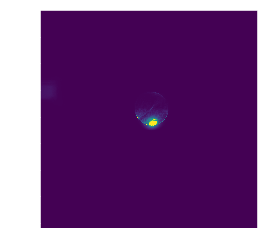

In [46]:
%matplotlib inline
frame0 = cam0.get_frame(100)
plt.imshow(frame0)

In [37]:
frame0

array([[112, 119, 126, ..., 125, 108, 100],
       [126, 124, 117, ..., 117, 127, 111],
       [113, 118, 109, ..., 106, 119, 135],
       ...,
       [120, 114, 108, ..., 117, 118, 112],
       [107, 111, 104, ..., 125, 116, 112],
       [116, 117, 111, ..., 108, 108, 120]], dtype=uint16)

In [38]:
io.imsave('file_test.tif', frame0)

C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: file_test.tif is a low contrast image
  warn('%s is a low contrast image' % fname)


In [42]:
24/350

0.06857142857142857

In [44]:
1.22/1.74

0.7011494252873564

<IPython.core.display.Javascript object>


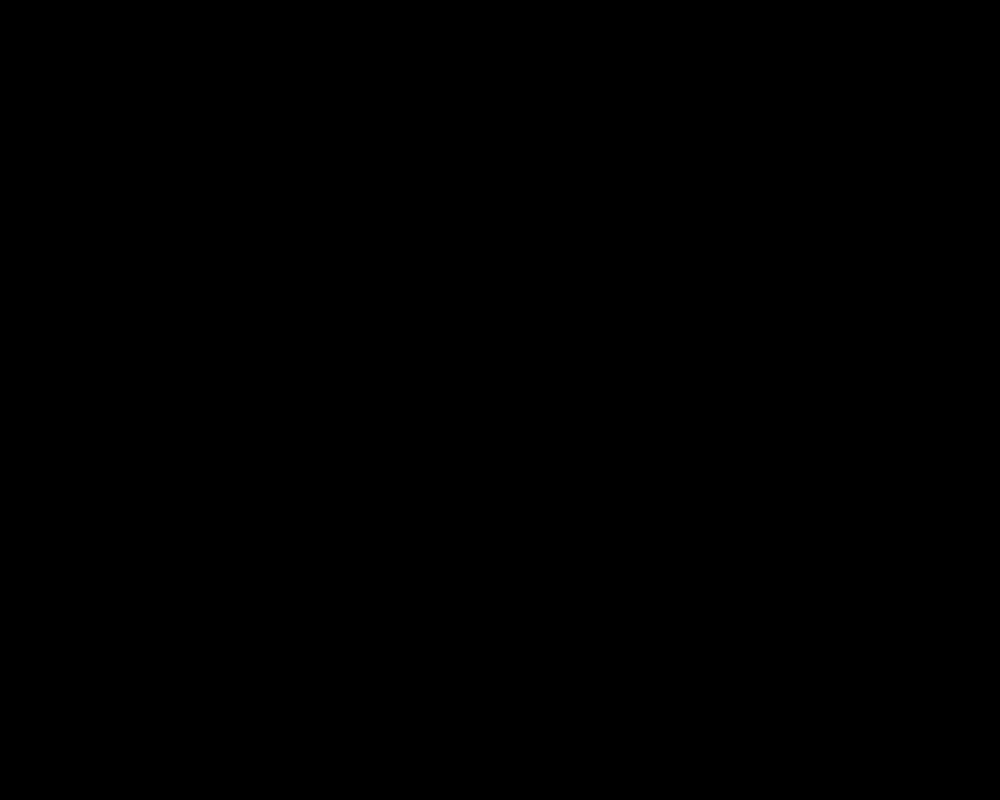

In [28]:
#LOOP WITH FOR SAVE IMAGE EVERY 25
#right now error savign io image (quality error?)

%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')
    
for i in range(0,int(1e2),25):
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(1, 1, 1)

    frame0 = cam0.get_frame(100)
    gray = ax1.imshow(frame0, label=frame0.sum()/426104919)
    ax1.set_title(frame0.sum()/426104919)
    fig.colorbar(gray)
    
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    #io.imsave('copy-file'+str(i)+'.tif', frame0)
    plt.clf()     # Clean figure to update legend, barplot...    

<IPython.core.display.Javascript object>


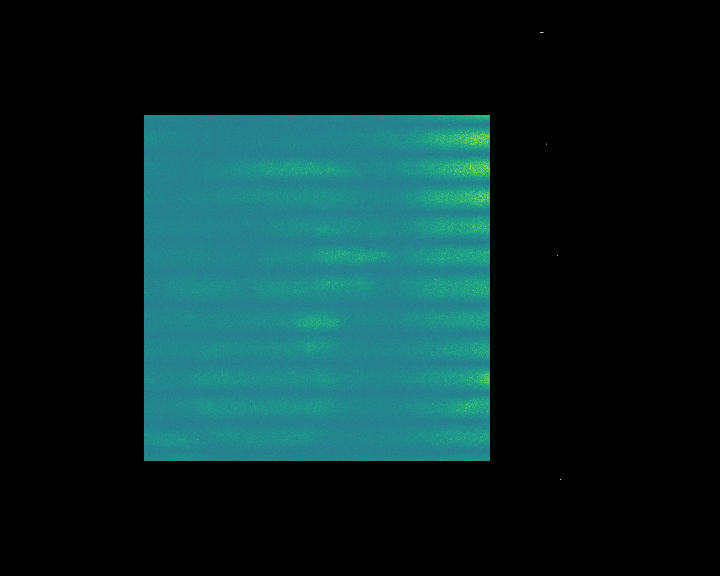

Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x000001A859D21DC8>
Traceback (most recent call last):
  File "C:\Users\IFIc\Anaconda3\lib\site-packages\matplotlib\transforms.py", line 179, in <lambda>
    target=child._parents: target.pop(sid))
KeyboardInterrupt


KeyboardInterrupt: 

<IPython.core.display.Javascript object>


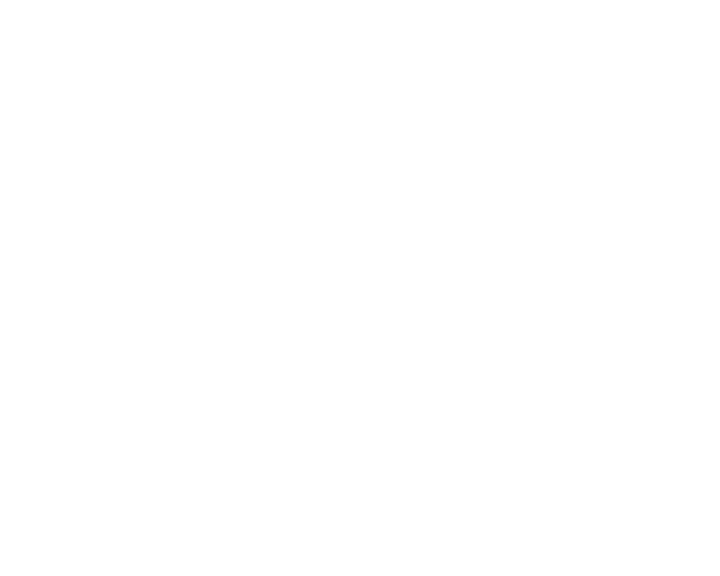

In [65]:
%matplotlib notebook
#fig, ax = plt.subplots(2, figsize=(12,12))
fig = plt.figure(figsize=(10,8))
fig.show()
fig.canvas.draw()
plt.style.use('dark_background')

while True:
    
    fig = plt.gcf()
    ax1 = fig.add_subplot(1, 1, 1)

    frame0 = cam0.get_frame(100)
    gray = ax1.imshow(frame0, label=frame0.sum()/426104919)
    ax1.set_title(frame0.sum()/426104919)
    fig.colorbar(gray)
    
    fig.canvas.draw()
    fig.tight_layout()
    #fig.canvas.update()
    fig.canvas.flush_events()
    fig.subplots_adjust(left=0.2, bottom=None, right=0.8, top=None, wspace=0.1, hspace=None)
    plt.clf()     # Clean figure to update legend, barplot...    

Intensity of glass 421966612


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: Glass_with_filter.tif is a low contrast image
  warn('%s is a low contrast image' % fname)


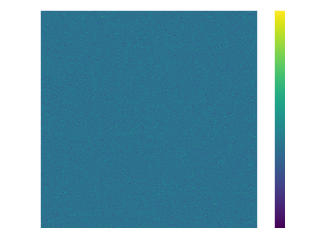

In [50]:
%matplotlib inline
frameglass = cam0.get_frame(100)
io.imsave('Glass_with_filter.tif', frameglass)
gray = plt.imshow(frameglass)
print('Intensity of glass',frameglass.sum())
plt.colorbar(gray)

Intensity of glass 421964502


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: Glass_with_filter_HP.tif is a low contrast image
  warn('%s is a low contrast image' % fname)


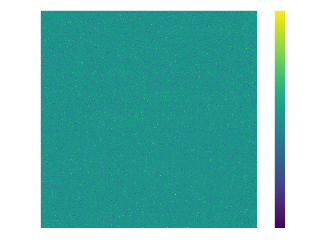

In [61]:
%matplotlib inline
frameglass2 = cam0.get_frame(100)
io.imsave('Glass_with_filter_HP.tif', frameglass2)
gray = plt.imshow(frameglass2)
print('Intensity of glass',frameglass2.sum())
plt.colorbar(gray)

Intensity of sample 428463940


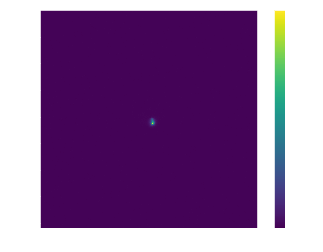

In [51]:
%matplotlib inline
frameflu = cam0.get_frame(100)
io.imsave('Sample_with_filter.tif', frameflu)
gray = plt.imshow(frameflu)
print('Intensity of sample',frameflu.sum())
plt.colorbar(gray)

Intensity of sample 545893885


C:\Users\IFIc\Anaconda3\lib\site-packages\skimage\io\_io.py:141: UserWarning: Sample_with_filter_HP.tif is a low contrast image
  warn('%s is a low contrast image' % fname)


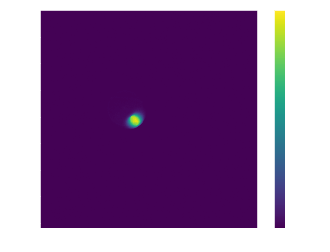

In [60]:
%matplotlib inline
frameflu2 = cam0.get_frame(100)
io.imsave('Sample_with_filter_HP.tif', frameflu2)
gray = plt.imshow(frameflu2)
print('Intensity of sample',frameflu2.sum())
plt.colorbar(gray)

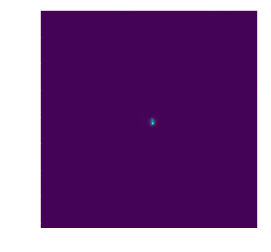

In [59]:
image = plt.imread('Sample_with_filter.tif')
%matplotlib inline
plt.imshow(image)

In [63]:
sample_int = frameflu.sum()

bg_int = frameglass.sum()

sample_int/bg_int

1.0153977300933943

In [62]:
sample_int_hp = frameflu2.sum()

bg_int_hp = frameglass2.sum()

sample_int_hp/bg_int_hp

1.293696228978048

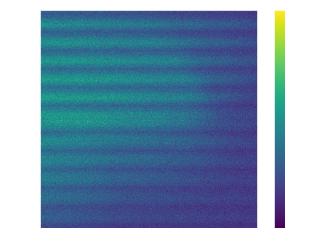

In [50]:
#filter
%matplotlib inline
frameflu3 = cam0.get_frame(100)
gray = plt.imshow(frameflu3)
plt.colorbar(gray)

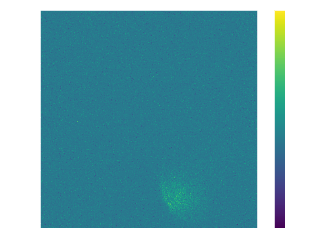

In [21]:
%matplotlib inline
frameot = cam0.get_frame(100)
gray = plt.imshow(frameot)
plt.colorbar(gray)

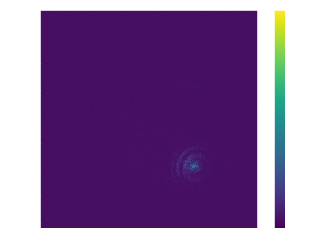

In [22]:
%matplotlib inline
frameref = cam0.get_frame(100)
gray = plt.imshow(frameref)
plt.colorbar(gray)

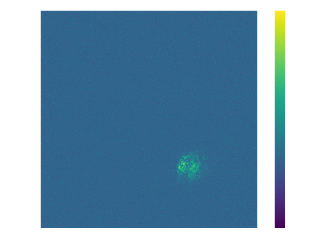

In [26]:
%matplotlib inline
frameref2 = cam0.get_frame(100)
gray = plt.imshow(frameref2)
plt.colorbar(gray)

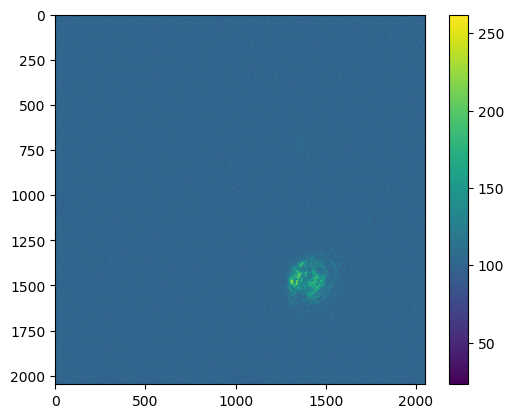

In [30]:
%matplotlib inline
plt.style.use('default')
gray = plt.imshow(frameref2)
plt.colorbar(gray)

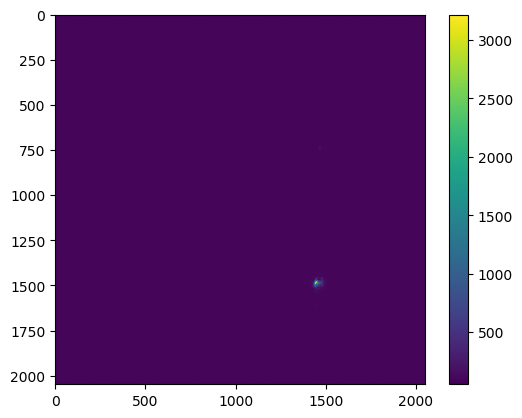

In [31]:
%matplotlib inline
plt.style.use('default')
gray = plt.imshow(frameflu2)
plt.colorbar(gray)

In [33]:
frameref2.sum()

426104919

In [34]:
frameflu2.sum()

426210157

In [35]:
frameflu2.sum() / frameref2.sum()

1.0002469767310993

(630, 1476)
(1428, 1515)
(1086, 1811)
(1000, 1100)


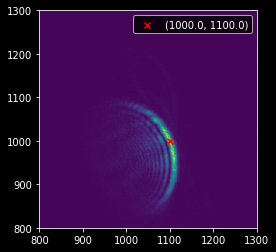

In [15]:
%matplotlib inline
plt.style.use('dark_background')
fig, ax = plt.subplots(1)

fitsh = []
for i in rquart:
    move_to_positionXY(serialport, position=i, center=center0)
    sleep(1)
    
    frameh = cam0.get_frame(100)
    ax.imshow(frameh)
    bestfit1 = guess_centroid(frameh)
    fitsh.append([bestfit1[0], bestfit1[1], frameh[bestfit1]]) # For each rmax (xy galvo) store image centroid (x,y) center and intensity
    
    cross = ax.scatter(x=bestfit1[1], y=bestfit1[0], marker='x',
                       color='r', label = '(%.1f, %.1f)' %(bestfit1[0], bestfit1[1]))
    ax.legend([cross], ['(%.1f, %.1f)' %(bestfit1[0], bestfit1[1])])
    print(bestfit1)
    ax.set_xlim(800, 1300)
    ax.set_ylim(800, 1300)